In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [247]:
raw_data = pd.read_csv('bank-full.csv',sep=';')

In [5]:
raw_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [7]:
raw_data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [8]:
target = raw_data['y']

In [9]:
target.unique()

array(['no', 'yes'], dtype=object)

In [10]:
target.value_counts()

y
no     39922
yes     5289
Name: count, dtype: int64

In [15]:
target.value_counts()/target.shape[0]

y
no     0.883015
yes    0.116985
Name: count, dtype: float64

In [16]:
raw_data.shape

(45211, 17)

In [11]:
df = raw_data

In [12]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


**observations :** in 'balance'  column there is a big difference between max and  75% Q3 that mean there is alot of outliers .
* in age also there is a difference between the max and the Q3 so there are alot of outliers
* the same thing in 'pdays' , 'previous', 'duration'   and 'campaign'  
we should hundle this outliers


   ### bank client data:
   1. age (numeric)
   2. job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student",
                                       "blue-collar","self-employed","retired","technician","services") 
   3. marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
   4. education (categorical: "unknown","secondary","primary","tertiary")
   5. default: has credit in default? (binary: "yes","no")
   6. balance: average yearly balance, in euros (numeric) 
   7. housing: has housing loan? (binary: "yes","no")
   8. loan: has personal loan? (binary: "yes","no")
   ### related with the last contact of the current campaign:
   9. contact: contact communication type (categorical: "unknown","telephone","cellular") 
  10. day: last contact day of the month (numeric)
  11. month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
  12. duration: last contact duration, in seconds (numeric)
   ### other attributes:
  13. campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  14. pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)
  15. previous: number of contacts performed before this campaign and for this client (numeric)
  16. poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")

  Output variable (desired target):
  17. y - has the client subscribed a term deposit? (binary: "yes","no")


In [14]:
categorical_cols = []
for col in df.select_dtypes('object'):
    categorical_cols.append(col)

categorical_cols    
    
    

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'y']

In [18]:
for col in categorical_cols  :
    print(f'{col} ------ {df[col].unique()} ')

job ------ ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student'] 
marital ------ ['married' 'single' 'divorced'] 
education ------ ['tertiary' 'secondary' 'unknown' 'primary'] 
default ------ ['no' 'yes'] 
housing ------ ['yes' 'no'] 
loan ------ ['no' 'yes'] 
contact ------ ['unknown' 'cellular' 'telephone'] 
month ------ ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep'] 
poutcome ------ ['unknown' 'failure' 'other' 'success'] 
y ------ ['no' 'yes'] 


## target Vs variable

In [19]:
df_without_target = df.drop(columns='y',axis = 1)

In [20]:
df_without_target.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome'],
      dtype='object')

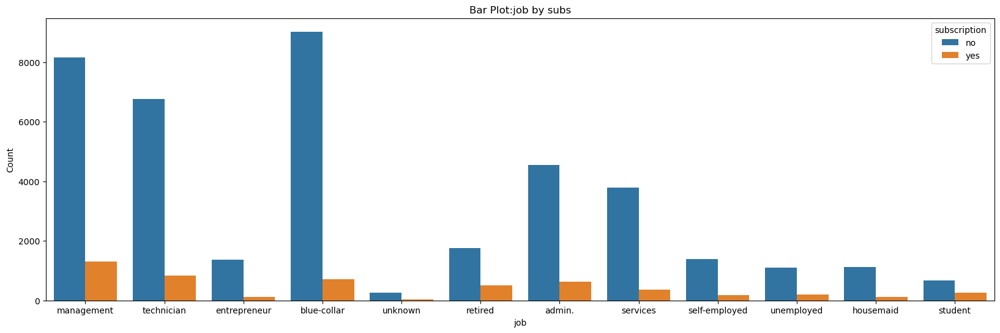

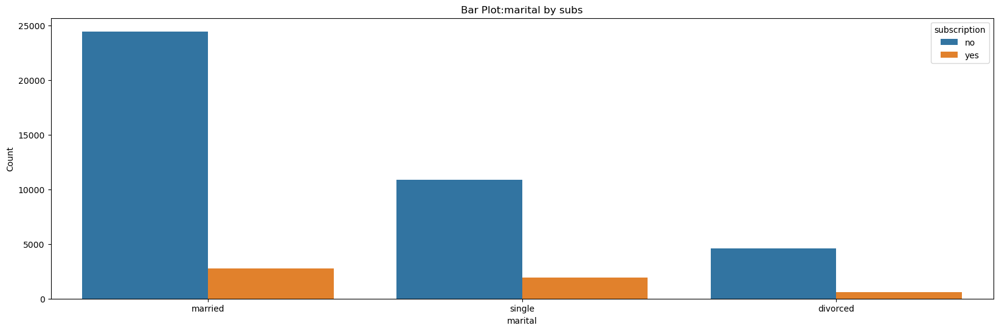

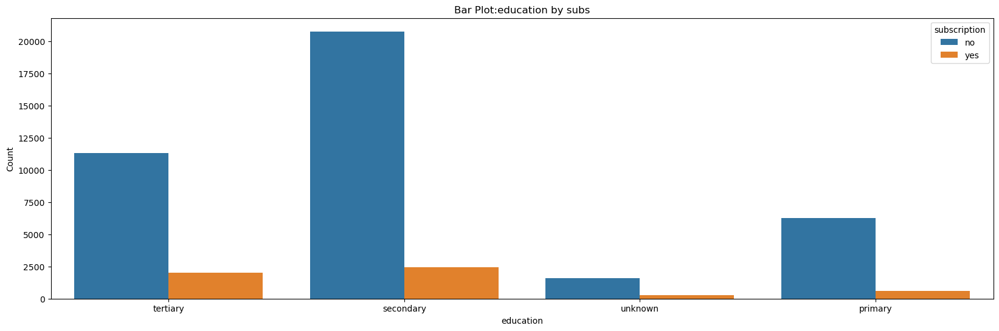

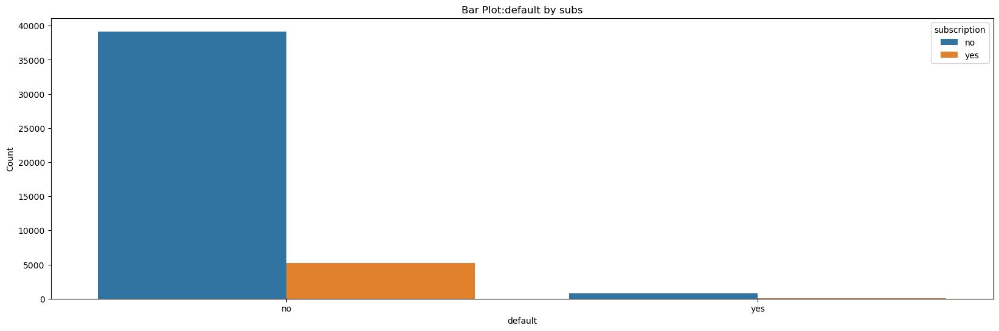

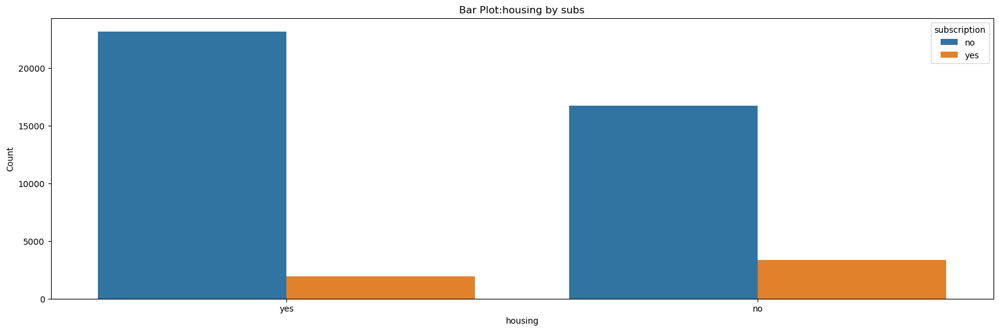

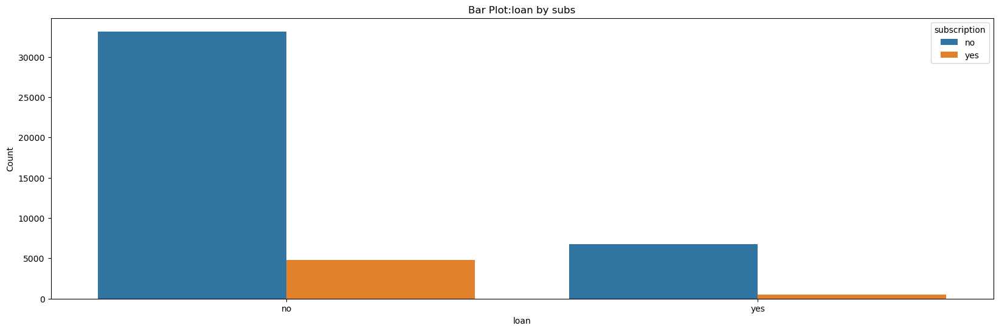

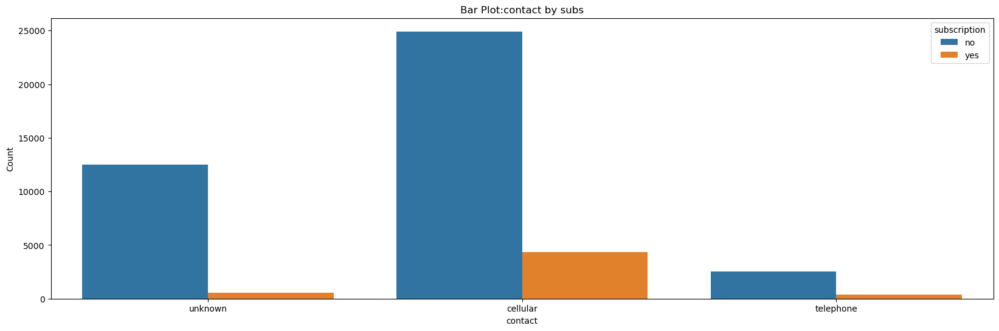

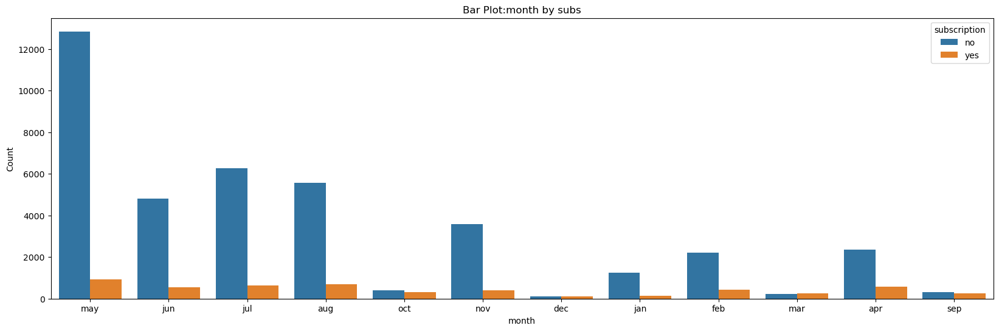

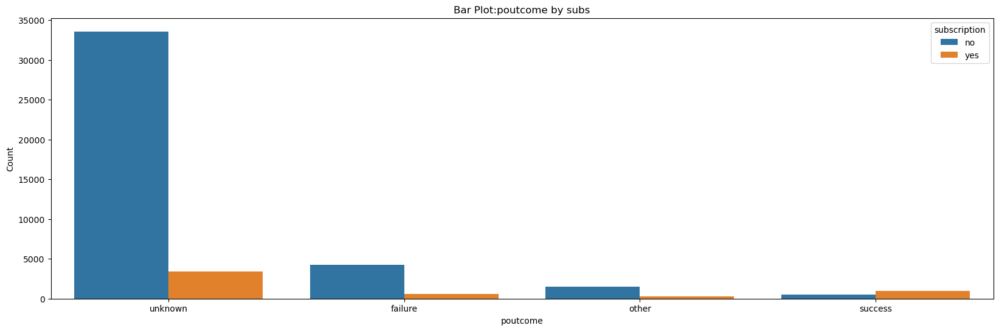

In [23]:
# visualise the categorical and target var
categories_vars = ['job','marital','education','default','housing', 'loan','contact','month','poutcome']
for col in categories_vars:
    # Create bar plot
    plt.figure(figsize=(20, 6))
    sns.countplot(data=df, x=col, hue='y')
    plt.xlabel(f'{col}')
    plt.ylabel('Count')
    plt.title(f'Bar Plot:{col} by subs')
    plt.legend(title='subscription')
    plt.show()

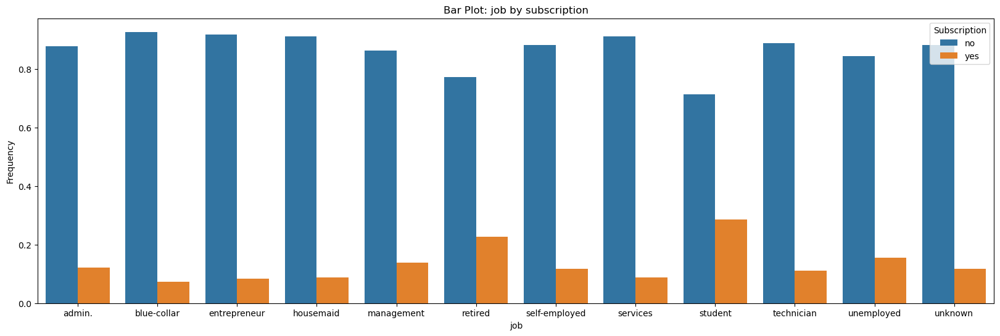

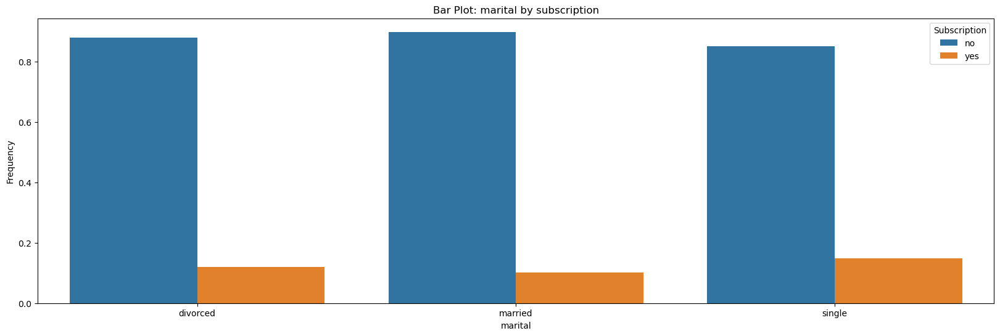

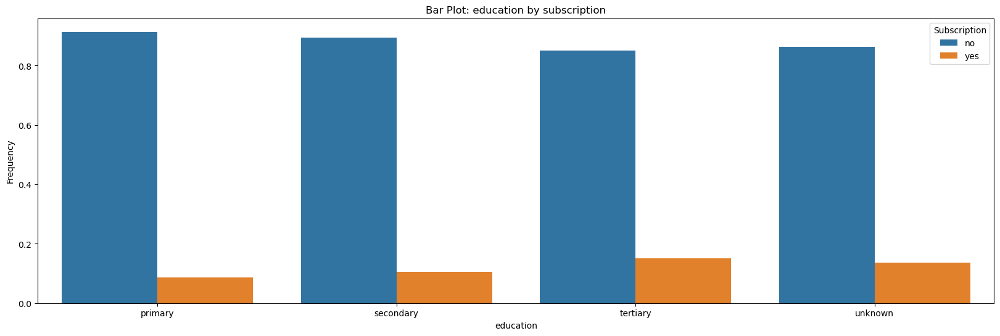

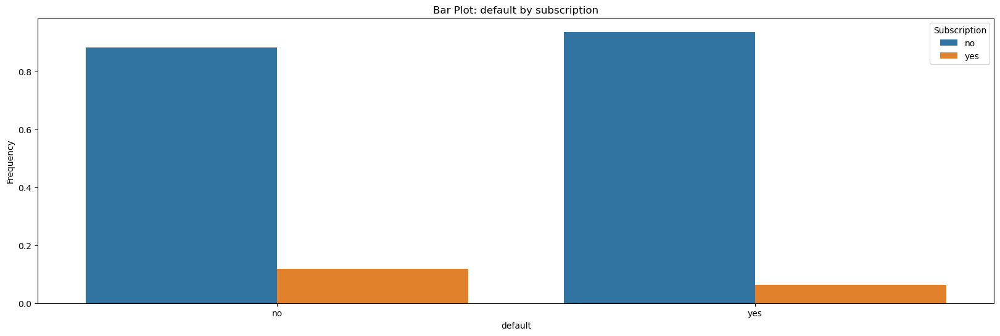

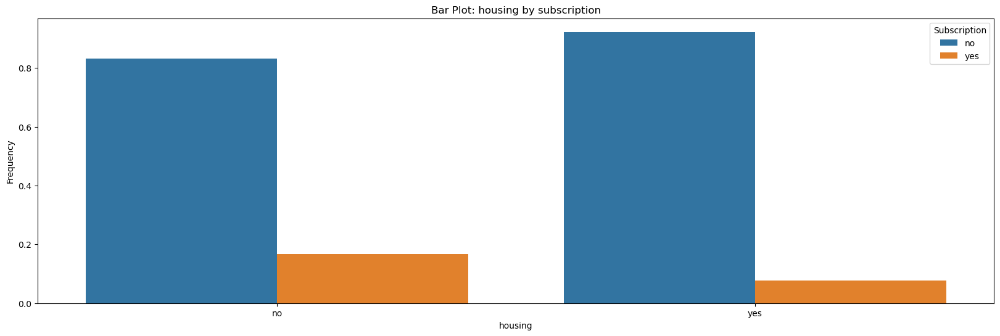

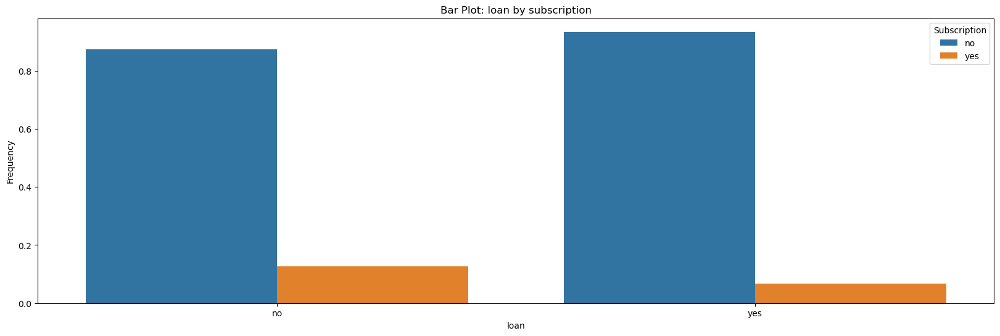

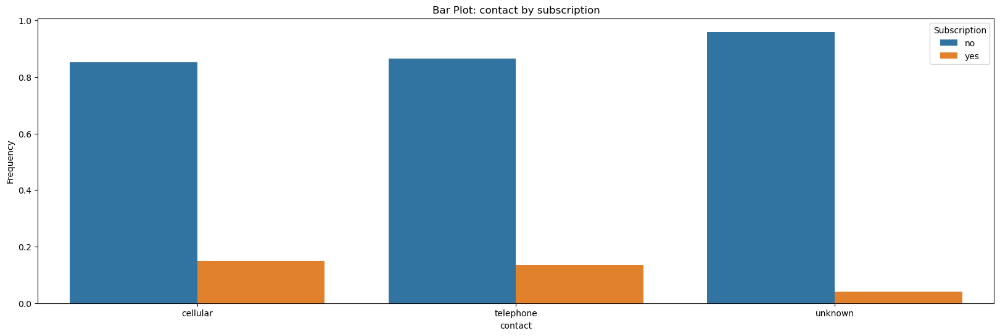

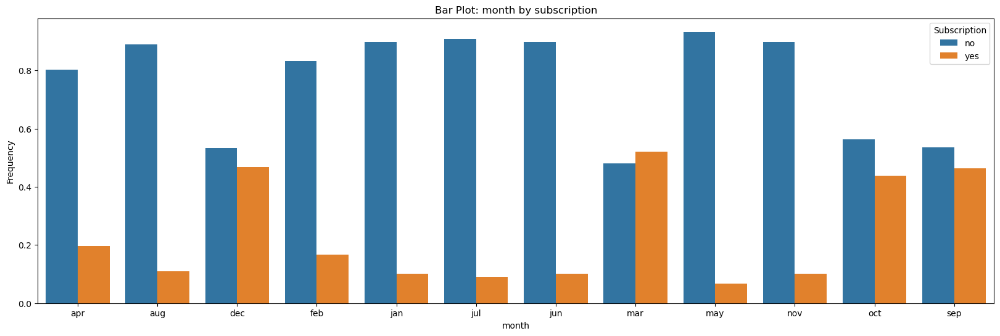

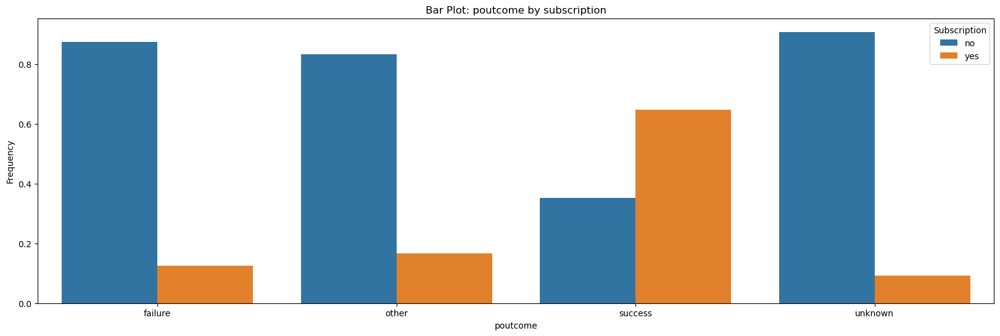

In [25]:
categories_vars = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

for col in categories_vars:
    # Calculate total count for each category
    total_count = df.groupby(col)['y'].count()
    
    # Calculate frequencies by dividing count by total count
    frequencies = df.groupby([col, 'y']).size() / total_count
    frequencies = frequencies.reset_index(name='frequency')
    
    # Plot
    plt.figure(figsize=(20, 6))
    sns.barplot(data=frequencies, x=col, y='frequency', hue='y')
    plt.xlabel(f'{col}')
    plt.ylabel('Frequency')
    plt.title(f'Bar Plot: {col} by subscription')
    plt.legend(title='Subscription', loc='upper right')
    plt.show()

**observations :**   the client working in  management , blue-collar , technician , admin , services  says no more than says yes  , the retired and students client say yes more than other categoy.
the single people says yes mor than the other categories.
education :tertiary  says yes more than other.
the people thatt says no  dont have housing  more than the clients have housing





## target vs numeric cols

In [30]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [31]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


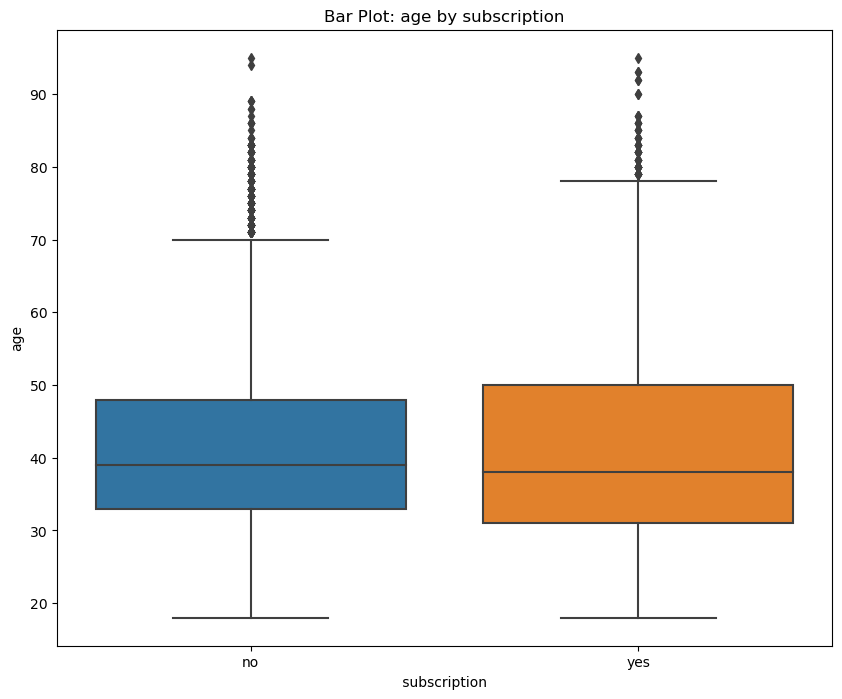

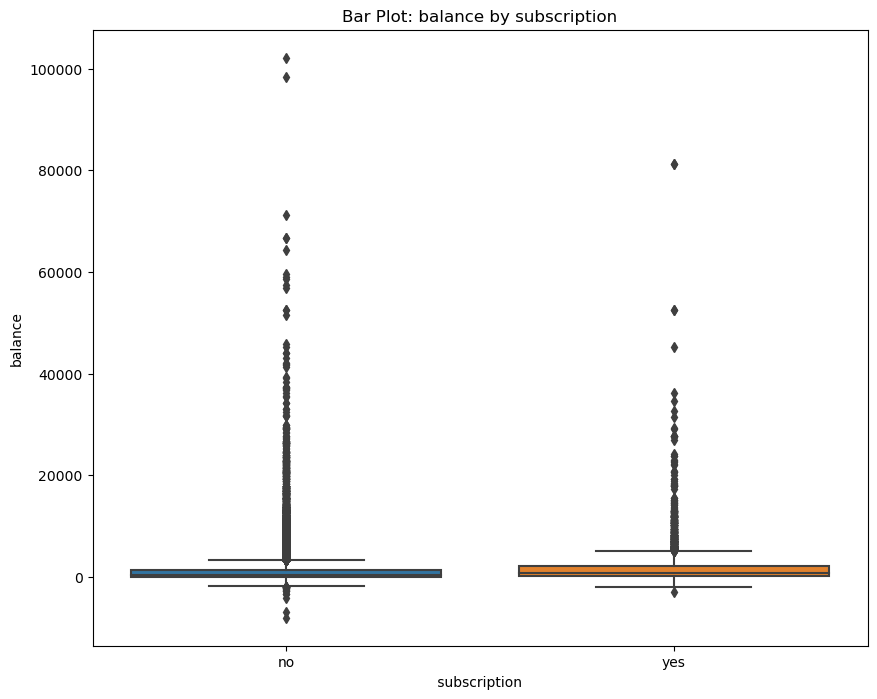

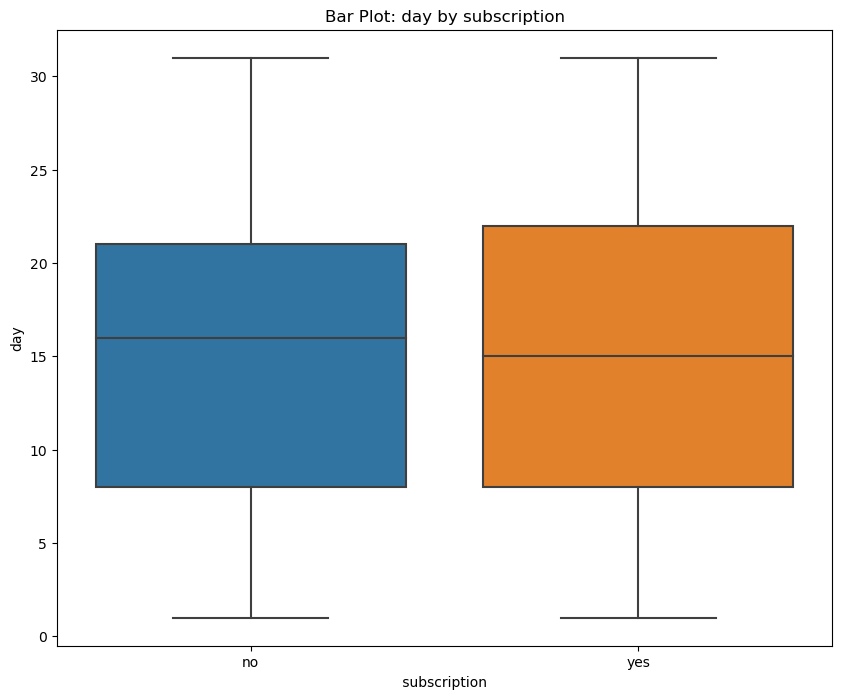

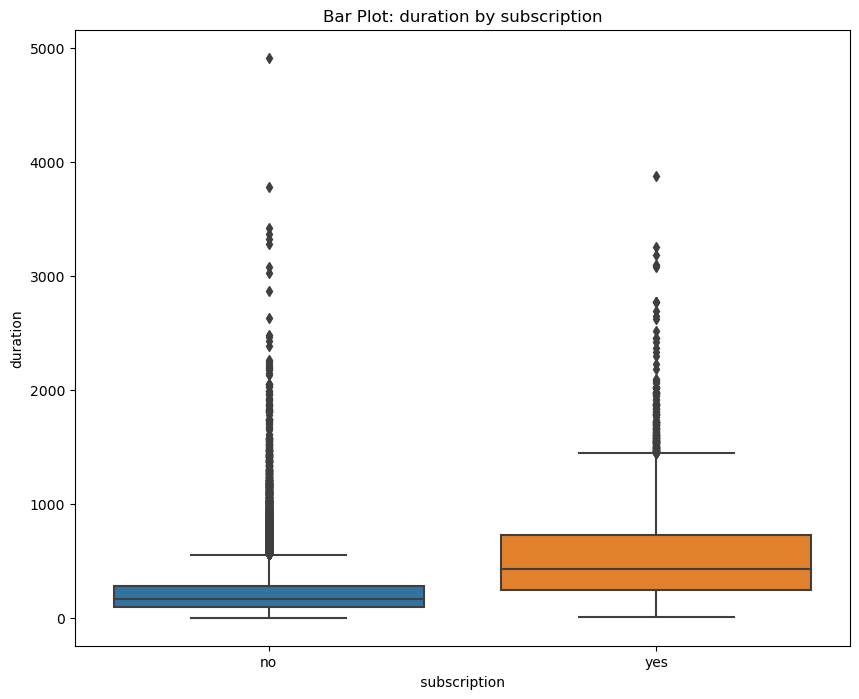

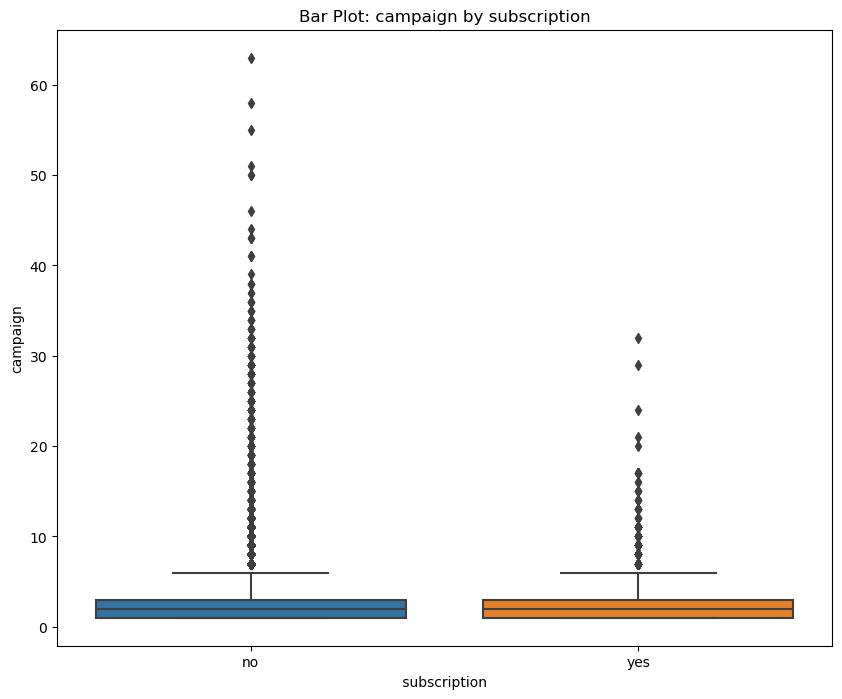

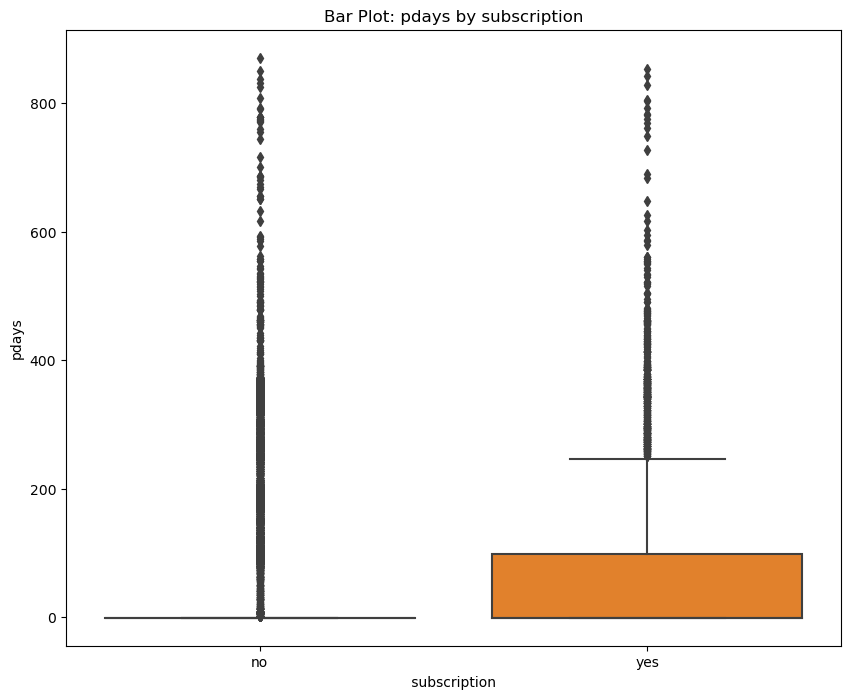

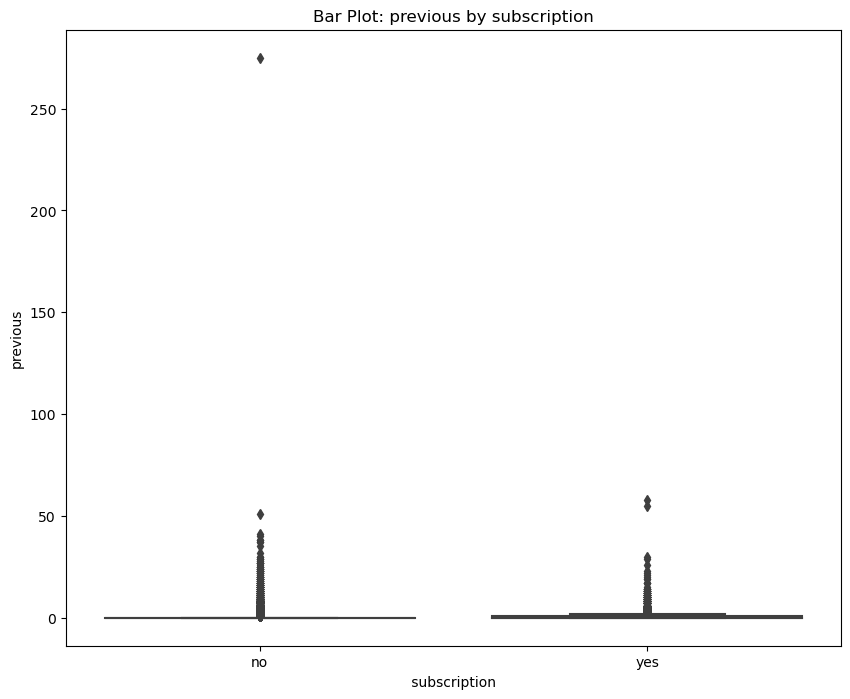

In [33]:
numericals_var=['age','balance','day','duration','campaign','pdays','previous']
for col in numericals_var:
    plt.figure(figsize=(10, 8))
    sns.boxplot(x=df['y'], y=raw_data[col])
    plt.xlabel(' subscription ')
    plt.ylabel(f'{col}')

    
    plt.title(f'Bar Plot: {col} by subscription')
    plt.show()

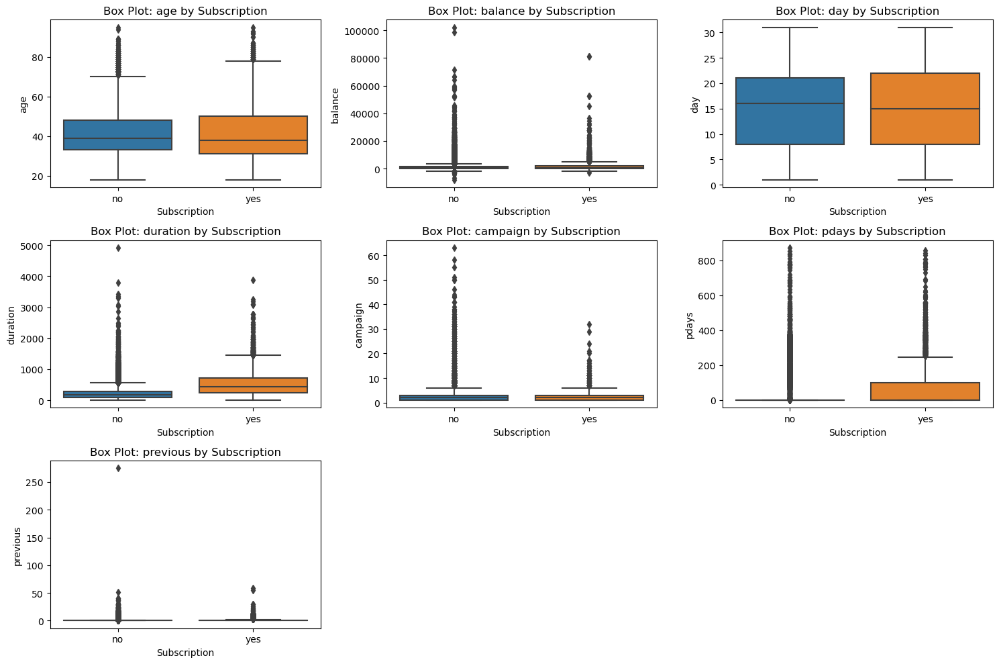

In [34]:


numericals_var = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

plt.figure(figsize=(15, 10))
for i, col in enumerate(numericals_var, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df['y'], y=df[col])
    plt.xlabel('Subscription')
    plt.ylabel(col)
    plt.title(f'Box Plot: {col} by Subscription')

plt.tight_layout()
plt.show()


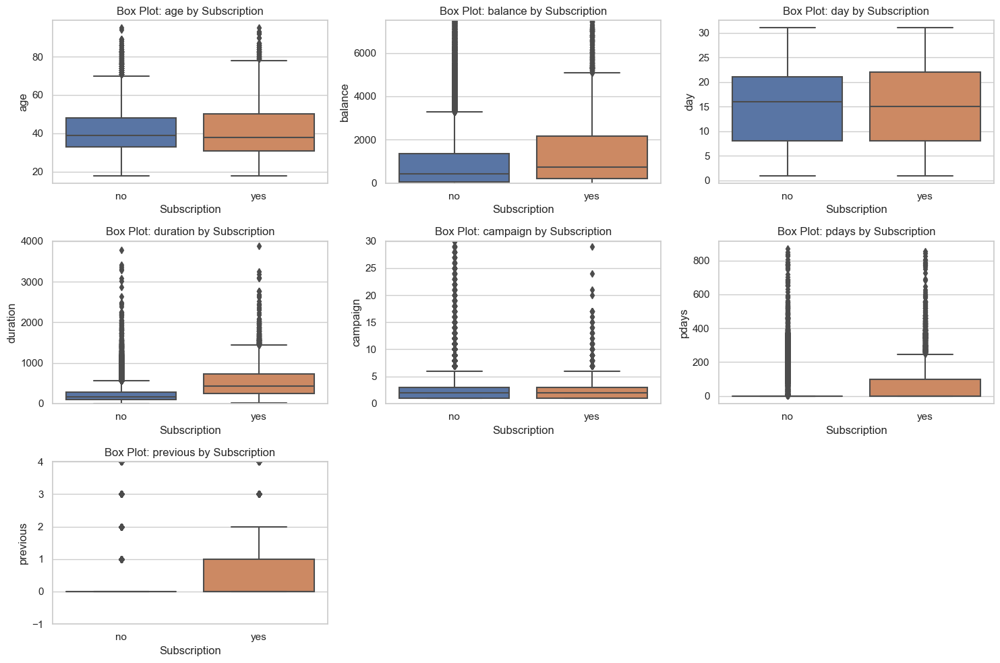

In [96]:
numericals_var = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

plt.figure(figsize=(15, 10))
for i, col in enumerate(numericals_var, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df['y'], y=df[col])

    if col == 'balance' :
        plt.ylim(0,7500)
    if col == 'previous' :
        plt.ylim(-1,4)
    #if col == 'pdays' :
        #plt.ylim(-1,400)
    if col == 'duration':
        plt.ylim(0,4000)
    if col == 'campaign':
        plt.ylim(0,30)
    plt.xlabel('Subscription')
    plt.ylabel(col)
    plt.title(f'Box Plot: {col} by Subscription')

plt.tight_layout()
plt.show()

**observations  :** 
 in 'previous for no there is only outliers this may be because this client says no so we dont know  number of contacts performed before this campaign and for this client (numeric) .
 the clients that says 'yes' has number of pdays more than  the people says no , 
  people who say yes  have on average, a higher last contact duration .
  Individuals who say yes have, on average, a balance higher than the individuals who say no.
  there is no diff in campaign between client say no and who say yes
  
  ***hypothesis :***
 * maybe  the  number of days that passed by after the client was last contacted from a previous campaign  ( ' pdays') is influenced of the client to say yes.
 * the balance has inflience  to client to say yes or no
 * 'pdays' number of days that passed by after the client was last contacted from a previous campaign influence to client say yes or no
 * 'campaign' has no influence in the target  (  number of contacts performed during this campaign and for this client (numeric, includes last contact)
* 'day'  last contact day of the month (numeric) has no influence for subscription


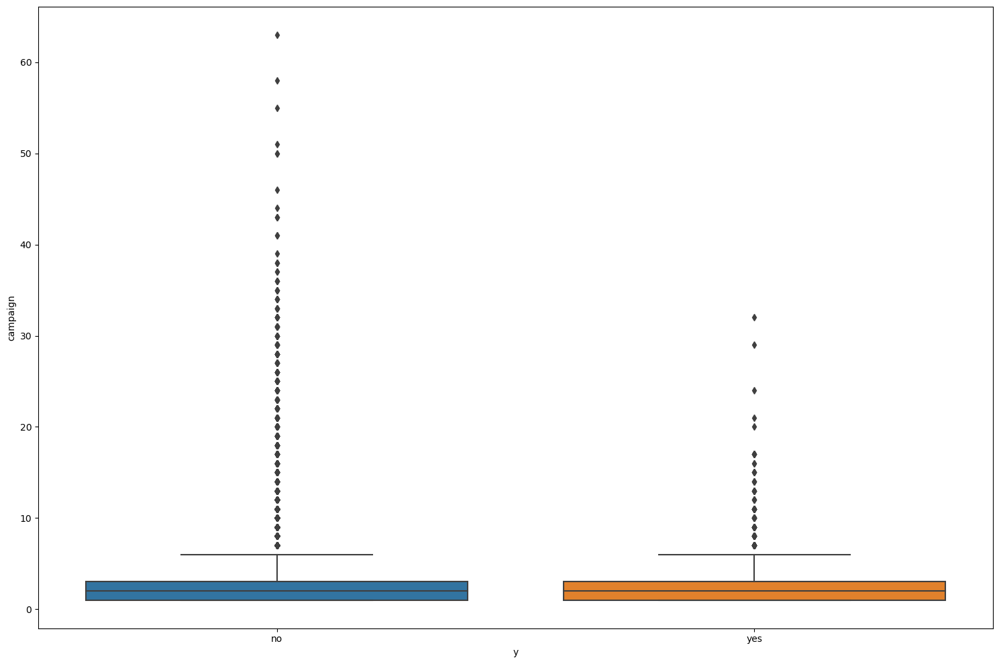

In [65]:
# the 'campaign' by the target
plt.figure(figsize=(15, 10))
sns.boxplot(x=df['y'], y=df['campaign'])
#plt.ylim(0,20)
plt.tight_layout()
plt.show()

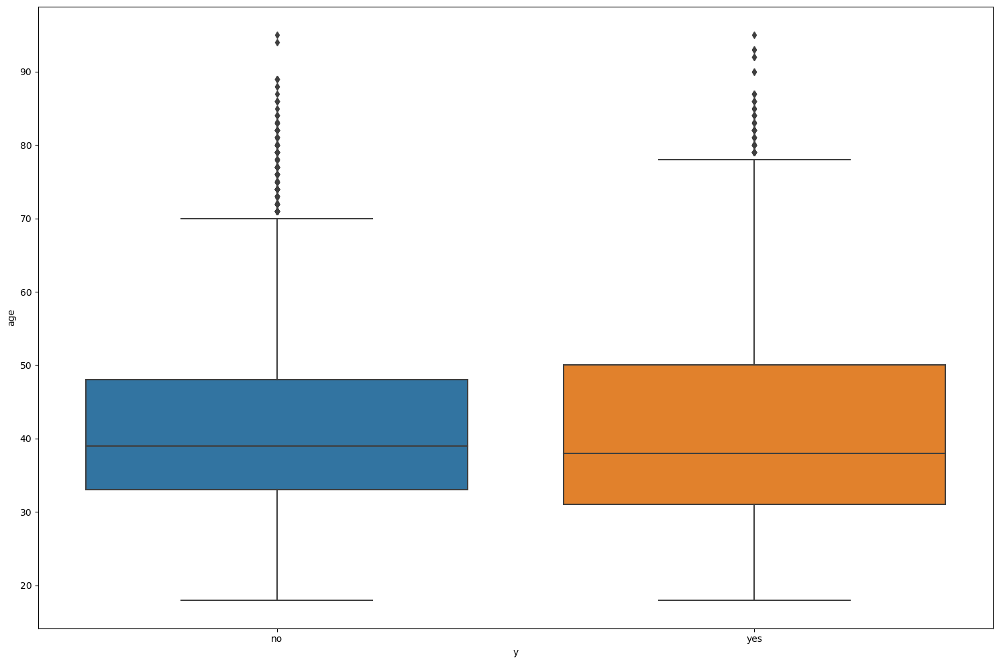

In [66]:
# the 'age' by the target
plt.figure(figsize=(15, 10))
sns.boxplot(x=df['y'], y=df['age'])
plt.tight_layout()
plt.show()

In [70]:
# filter the data by subscribed or not
yes_rows = df[ df['y'] =='yes']
no_rows = df[df['y']=='no']
yes_rows

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
83,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
86,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
87,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
129,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
168,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,yes
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes


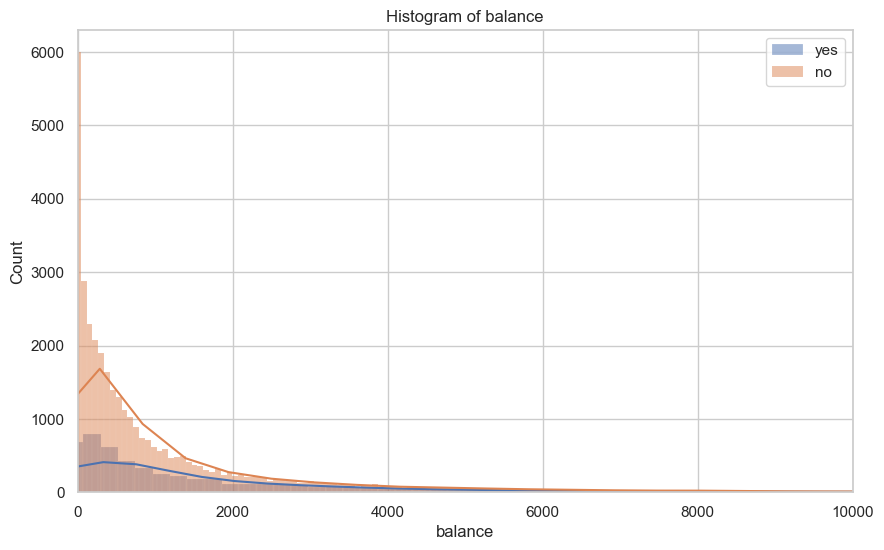

In [101]:
# balance by subcription
yes_balance = yes_rows['balance']
no_balance = no_rows['balance']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_balance,  label='yes', kde=True)
sns.histplot(no_balance,  label='no', kde=True)
plt.title('Histogram of balance')
plt.xlabel('balance')
plt.xlim(-1,10000)
plt.legend()

plt.show()

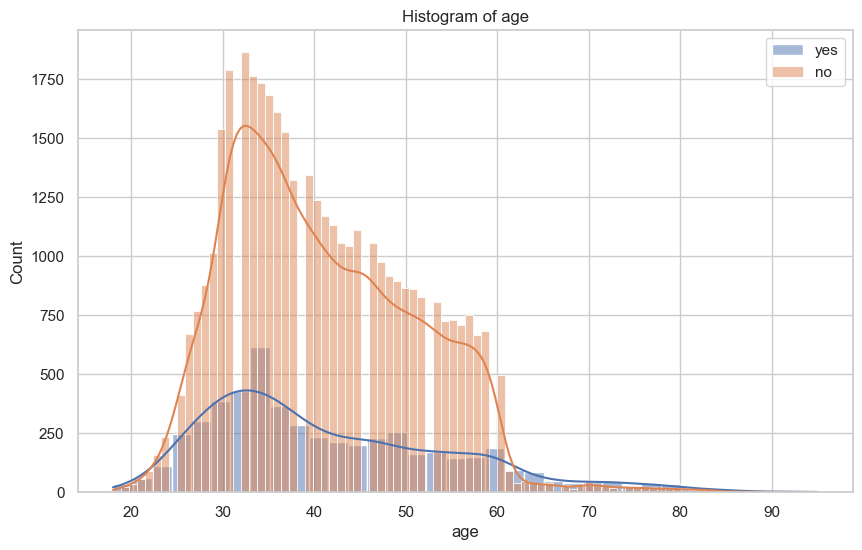

In [105]:
# age by subscription
yes_age = yes_rows['age']
no_age = no_rows['age']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_age,  label='yes', kde=True)
sns.histplot(no_age,  label='no', kde=True)
plt.title('Histogram of age')
plt.xlabel('age')
#plt.xlim(0,10000)
plt.legend()

plt.show()

the client that say no  has a marge of age between 20 and 80 

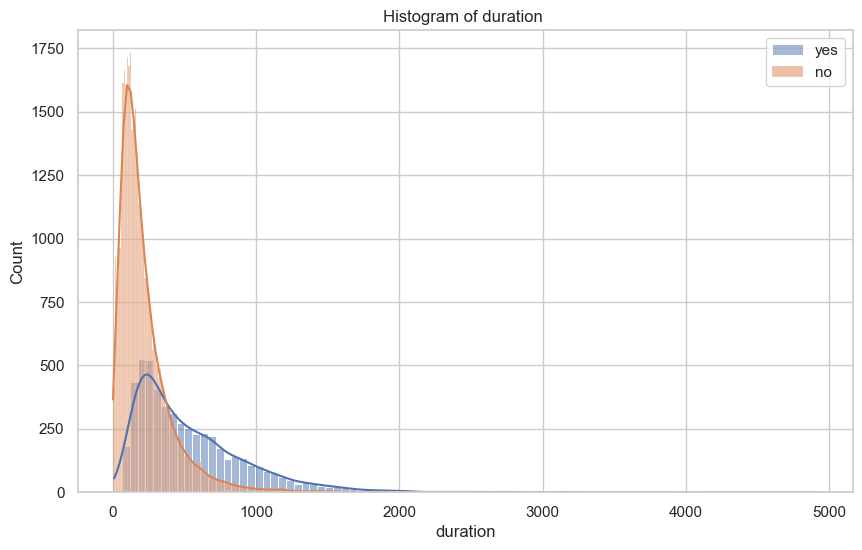

In [98]:
# duration by subscription
yes_duration = yes_rows['duration']
no_duration = no_rows['duration']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_duration,  label='yes', kde=True)
sns.histplot(no_duration,  label='no', kde=True)
plt.title('Histogram of duration ')
plt.xlabel('duration')
#plt.xlim(0,10000)
plt.legend()

plt.show()

duration is higher for peope who says yes

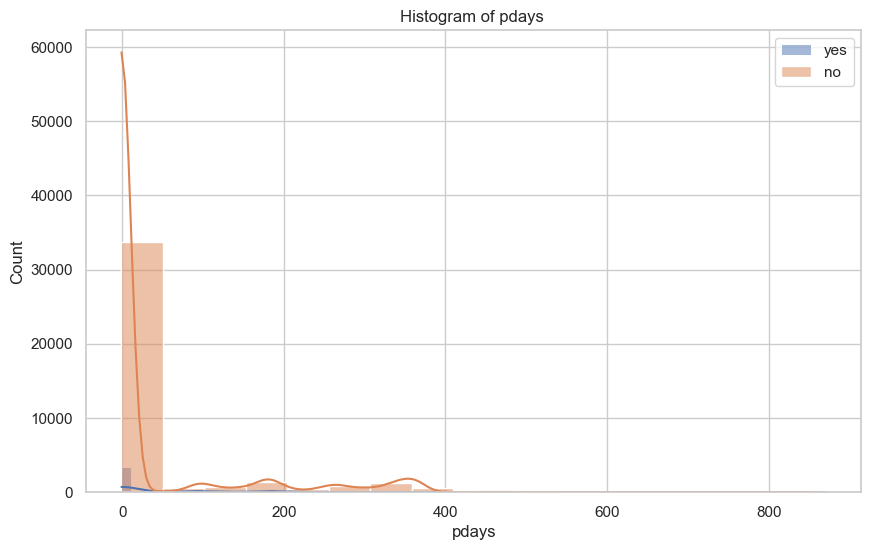

In [99]:
# pdays by subscription
yes_pdays = yes_rows['pdays']
no_pdays = no_rows['pdays']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_pdays,  label='yes', kde=True)
sns.histplot(no_pdays,  label='no', kde=True)
plt.title('Histogram of pdays ')
plt.xlabel('pdays')
#plt.xlim(0,10000)
plt.legend()

plt.show()

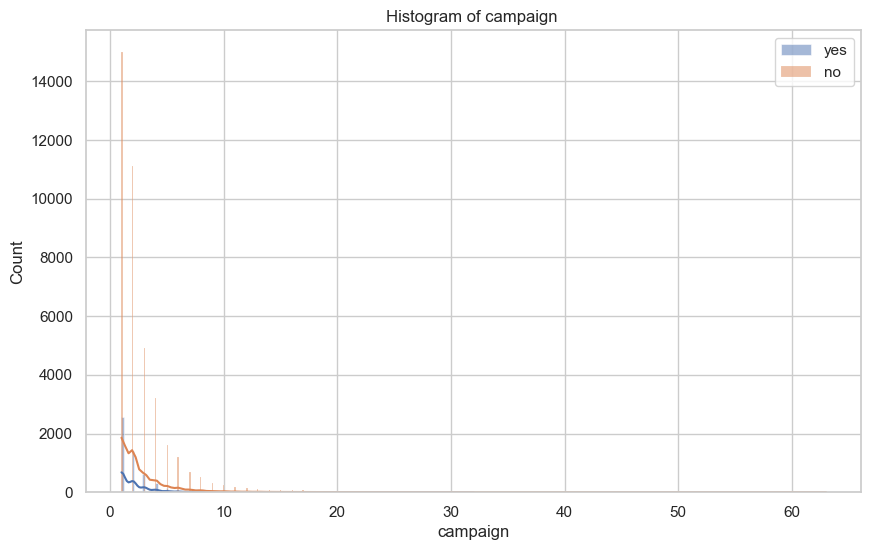

In [102]:
# campaign by subscription
yes_campaign = yes_rows['campaign']
no_campaign = no_rows['campaign']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_campaign,  label='yes', kde=True)
sns.histplot(no_campaign,  label='no', kde=True)
plt.title('Histogram of campaign ')
plt.xlabel('campaign')
#plt.xlim(0,10000)
plt.legend()

plt.show()

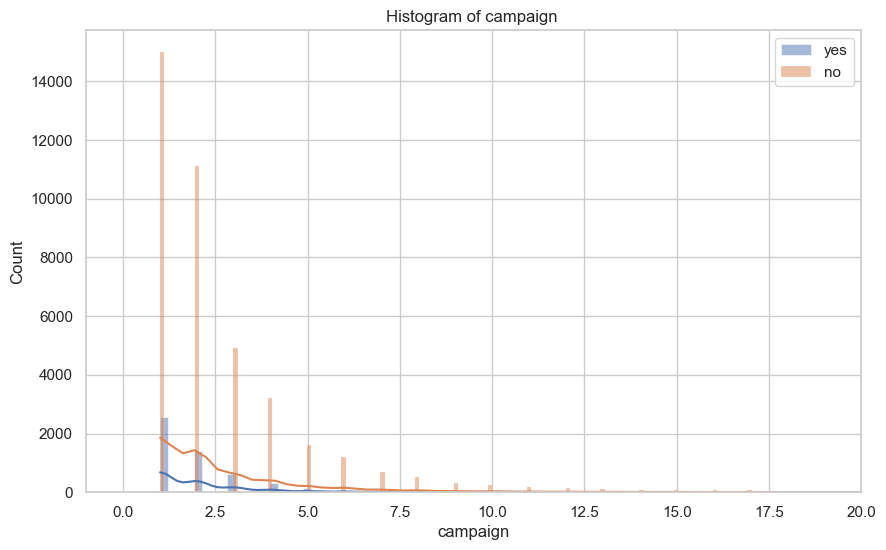

In [103]:
# campaign by subscription
yes_campaign = yes_rows['campaign']
no_campaign = no_rows['campaign']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_campaign,  label='yes', kde=True)
sns.histplot(no_campaign,  label='no', kde=True)
plt.title('Histogram of campaign ')
plt.xlabel('campaign')
plt.xlim(-1,20)
plt.legend()

plt.show()

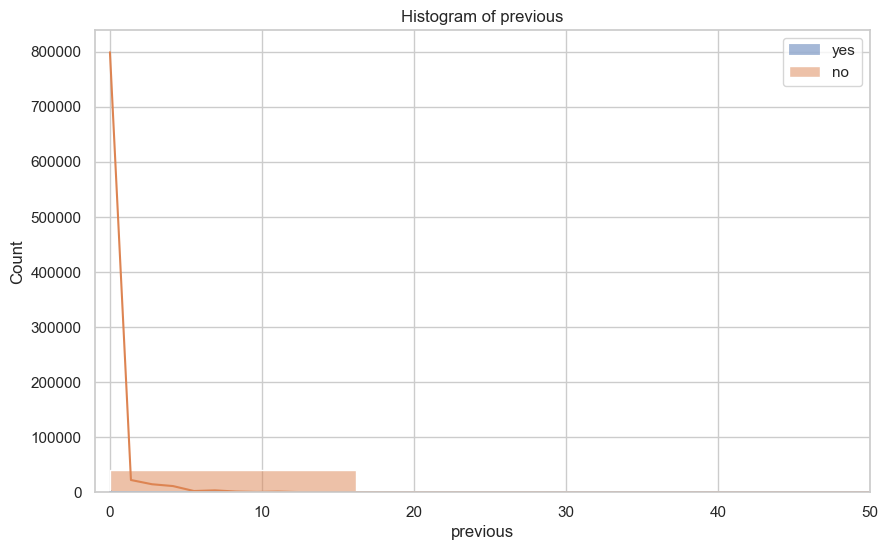

In [109]:
# previous by subscription
yes_previous = yes_rows['previous']
no_previous = no_rows['previous']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'balance'
plt.figure(figsize=(10, 6))
sns.histplot(yes_previous,  label='yes', kde=True)
sns.histplot(no_previous,  label='no', kde=True)
plt.title('Histogram of previous')
plt.xlabel('previous')
plt.xlim(-1,50)
plt.legend()

plt.show()

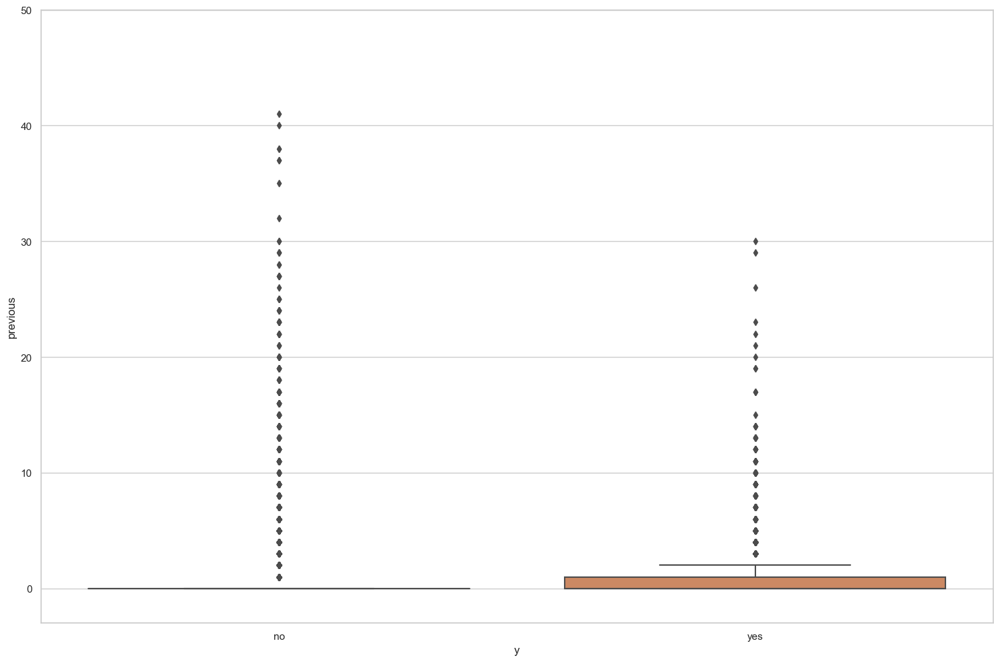

In [124]:
# the 'previous' by the target
plt.figure(figsize=(15, 10))
sns.boxplot(x=df['y'], y=df['previous'])
plt.ylim(-3,50)
plt.tight_layout()
plt.show()

In [120]:
yes_previous.describe()

count    5289.000000
mean        1.170354
std         2.553272
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max        58.000000
Name: previous, dtype: float64

In [121]:
no_previous.describe()

count    39922.000000
mean         0.502154
std          2.256771
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        275.000000
Name: previous, dtype: float64

whe should remove the outliers and then test the occuracy

## variable Vs variable

In [126]:
df_without_target

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown


In [128]:
df['default'].unique()

array(['no', 'yes'], dtype=object)

In [134]:
yes_default = df[df['default']=='yes']
no_default = df[df['default']=='no']

In [ ]:
#let's test if there is any relation between if the client has credit in default or  no with the other varibles
# default  by duration
duration_yes_default=yes_default['duration']
duration_no_default=no_default['duration']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'default'
plt.figure(figsize=(10, 6))
sns.histplot(yes_default['duration'], label='yes', kde=True)
sns.histplot(no_default['duration'],  label='no', kde=True)
plt.title('Histogram of default  ')
plt.xlabel('default')
plt.xlim(-1,20)
plt.legend()

plt.show()

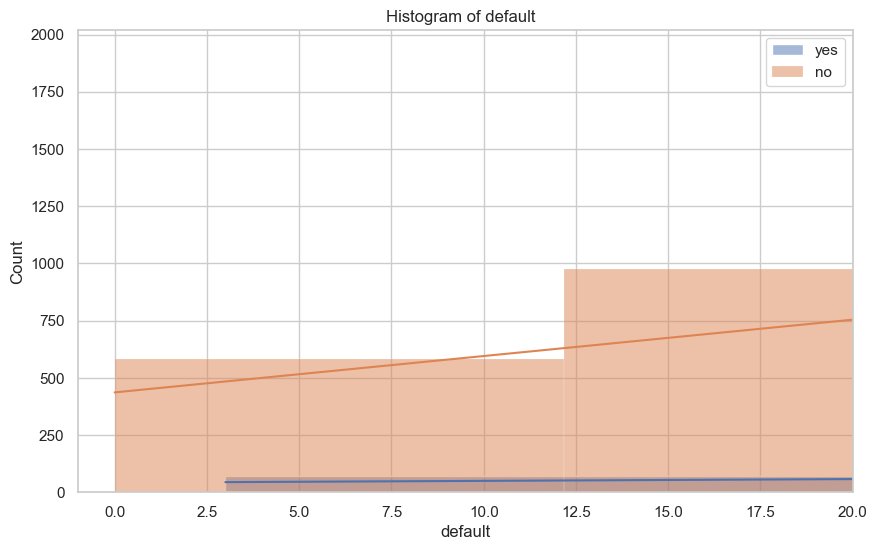

In [136]:
#let's test if there is any relation between if the client has credit in default or  no with the other varibles
# default  by duration
duration_yes_default=yes_default['duration']
duration_no_default=no_default['duration']
# Set style
sns.set(style="whitegrid")

# Create histogram of 'default'
plt.figure(figsize=(10, 6))
sns.histplot(duration_yes_default, label='yes', kde=True)
sns.histplot(duration_no_default,  label='no', kde=True)
plt.title('Histogram of default  ')
plt.xlabel('default')
plt.xlim(-1,20)
plt.legend()

plt.show()

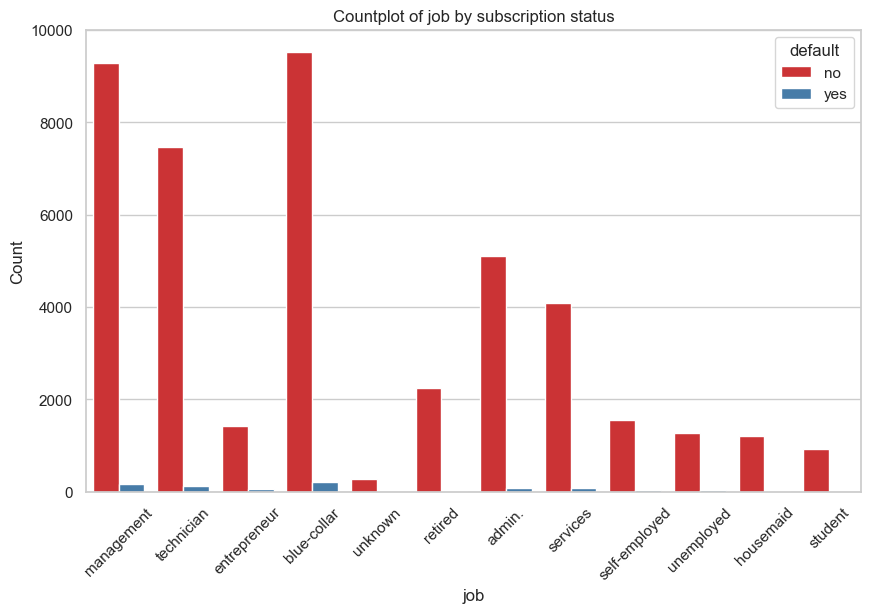

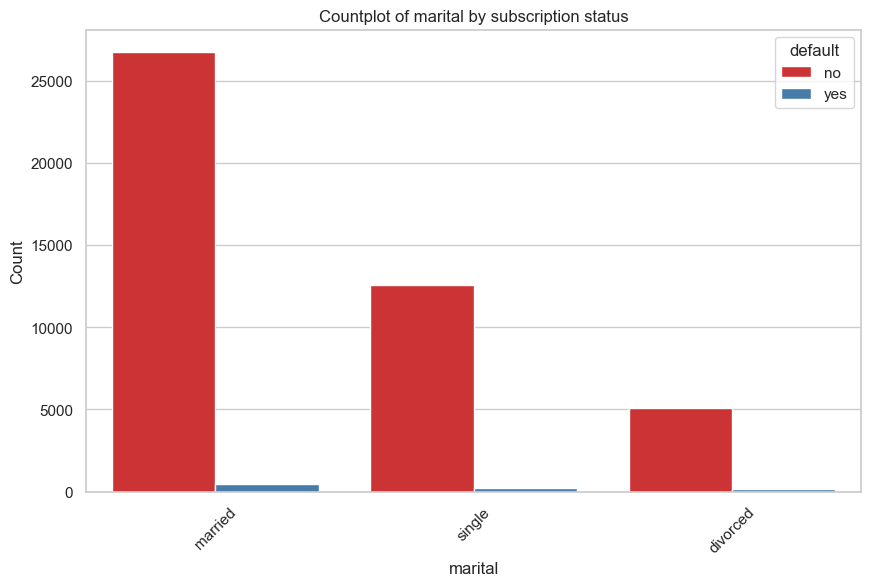

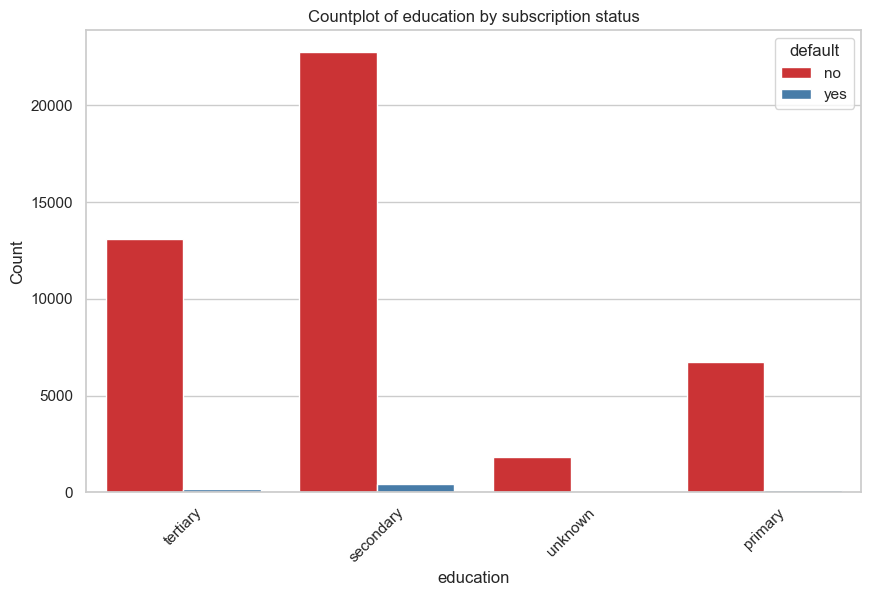

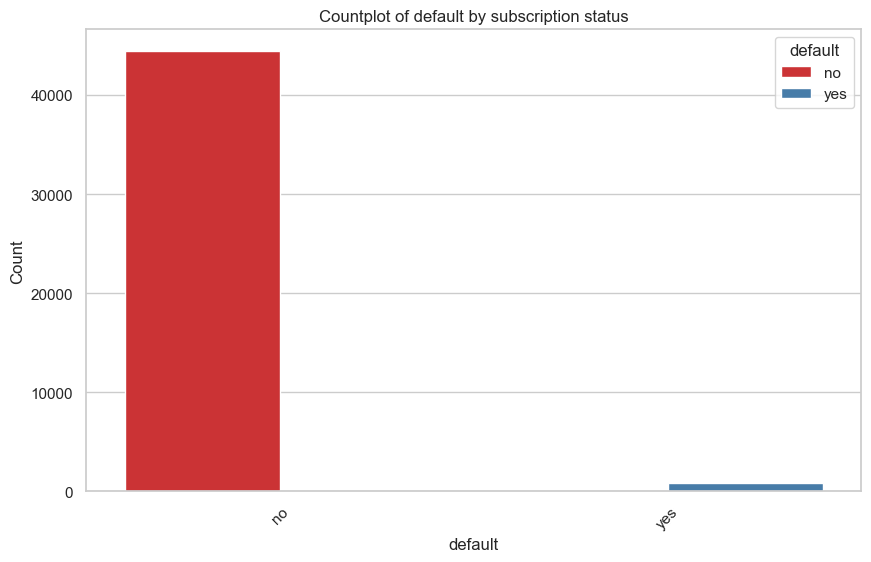

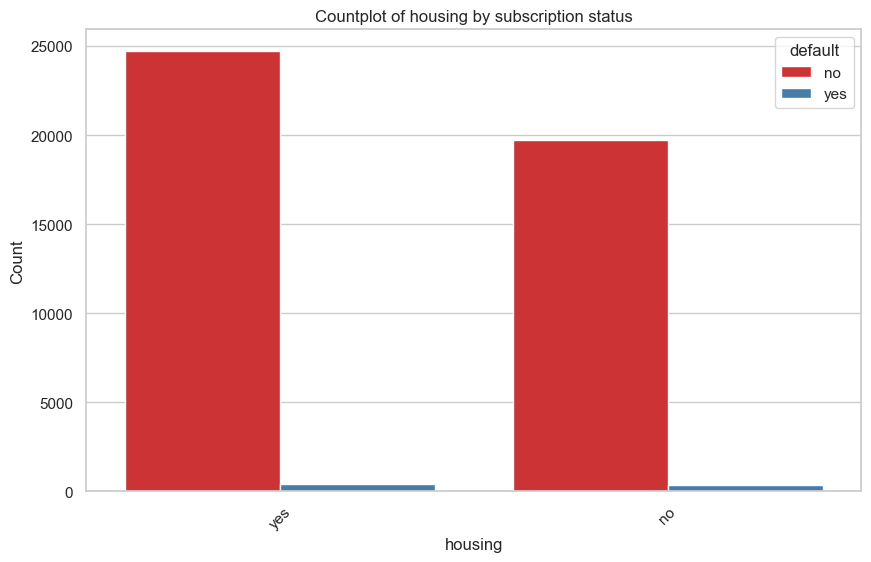

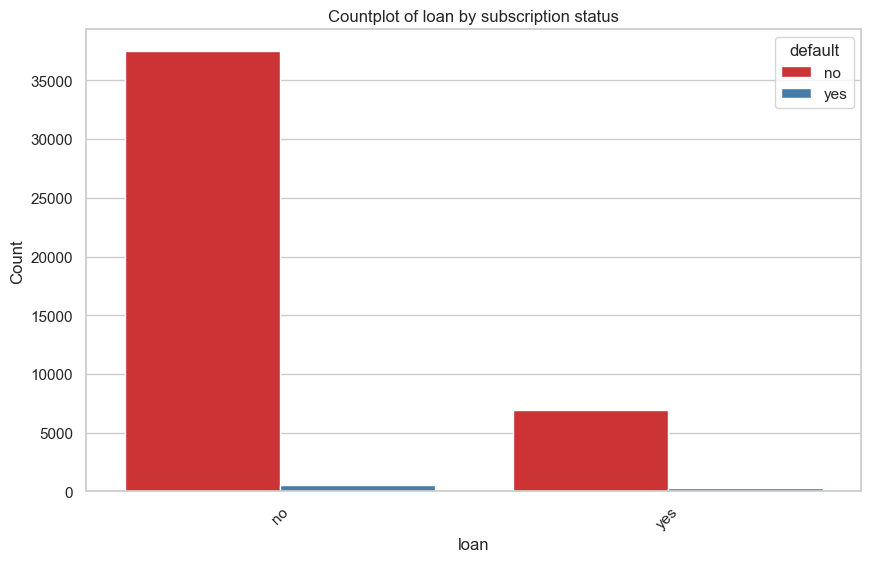

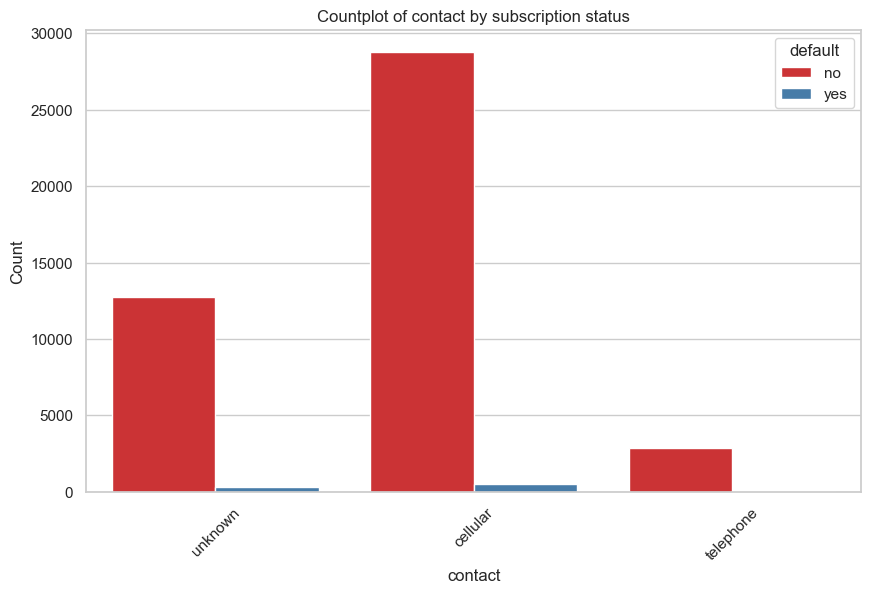

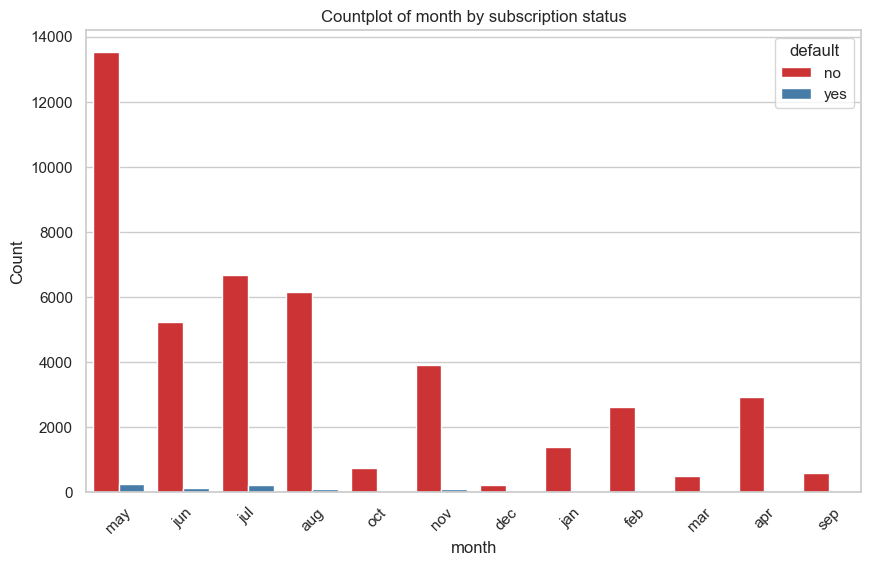

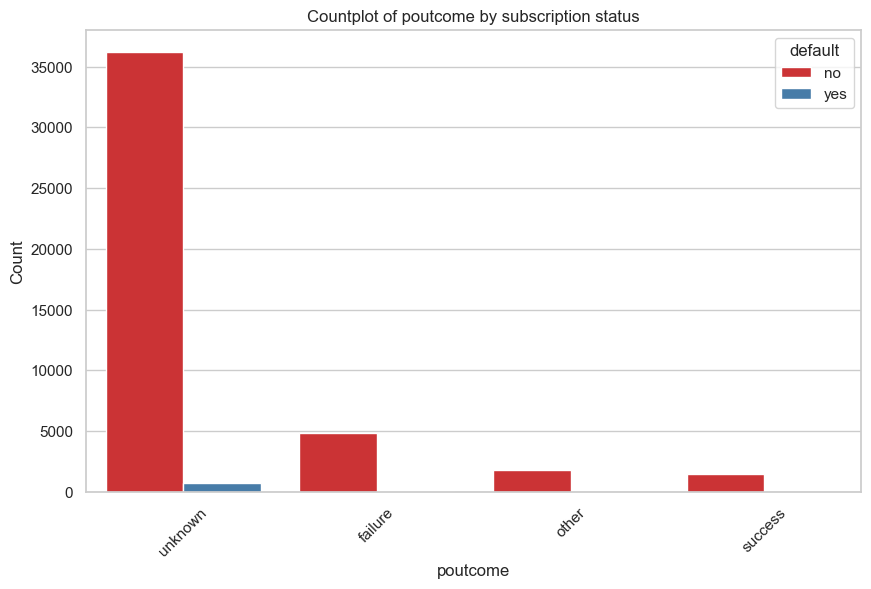

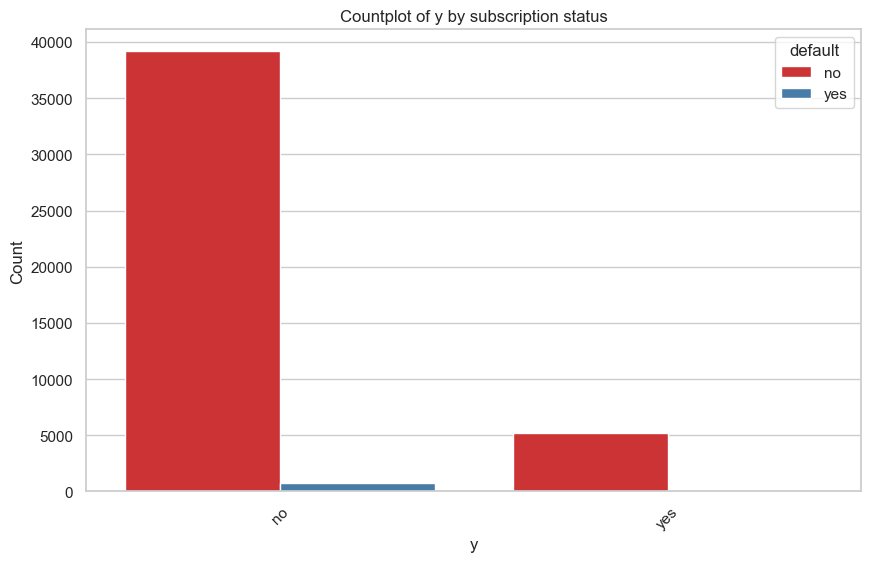

In [141]:
# Define the categorical variables
cols = ['age', 'job', 'marital', 'education', 'balance', 'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome']
categories_cols = ['job','marital','education','housing', 'loan','contact','month','poutcome']

# Iterate through each categorical column
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col, hue='default', palette='Set1', hue_order=['no', 'yes'])
    plt.title(f'Countplot of {col} by subscription status')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(title='default', loc='upper right')
    plt.show()

In [140]:
df['default'].unique()

array(['no', 'yes'], dtype=object)

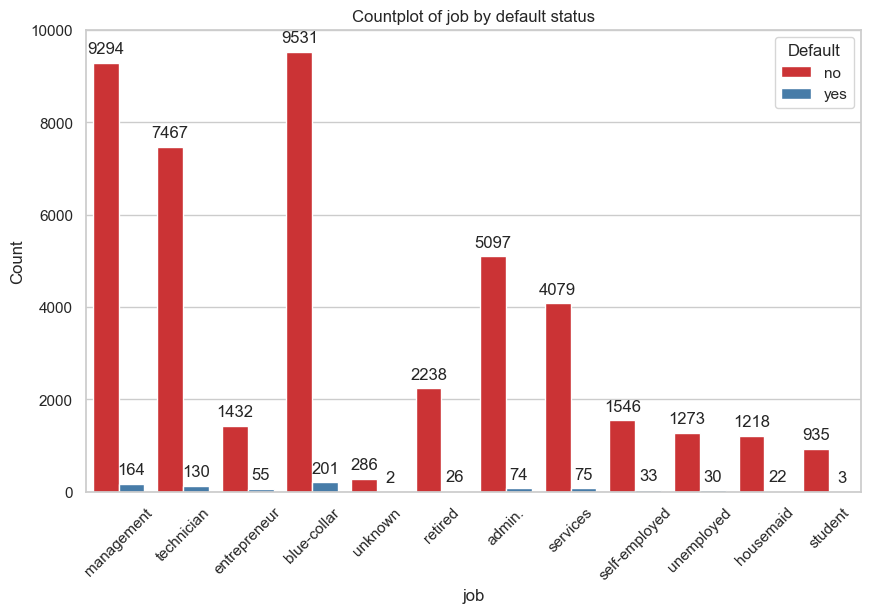

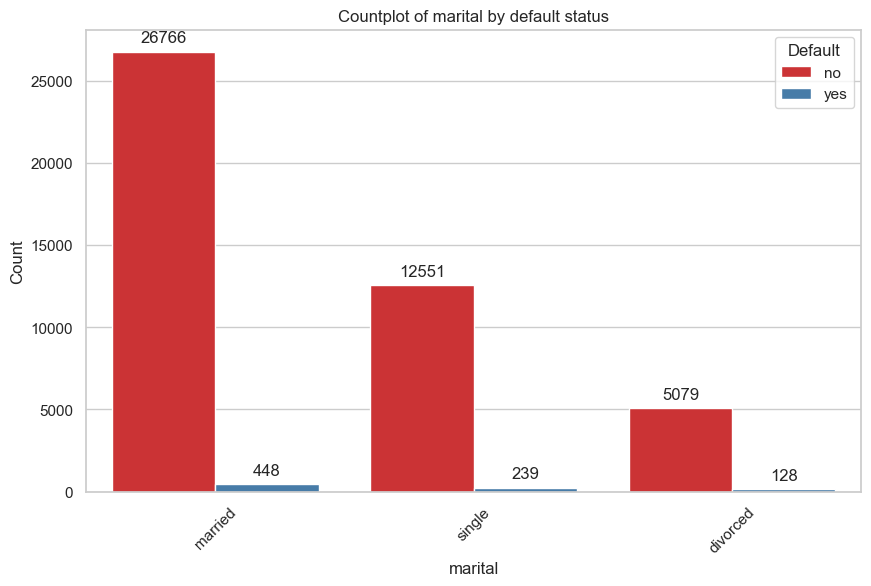

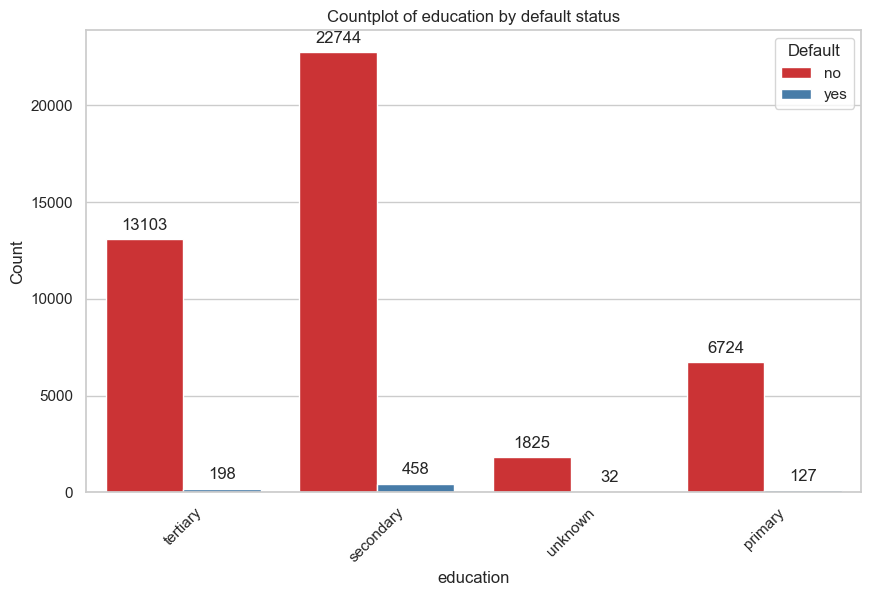

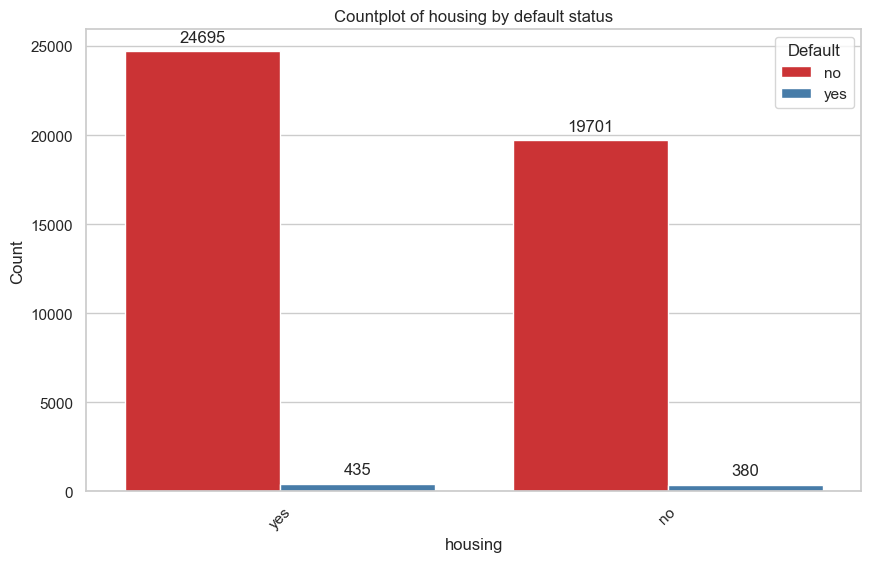

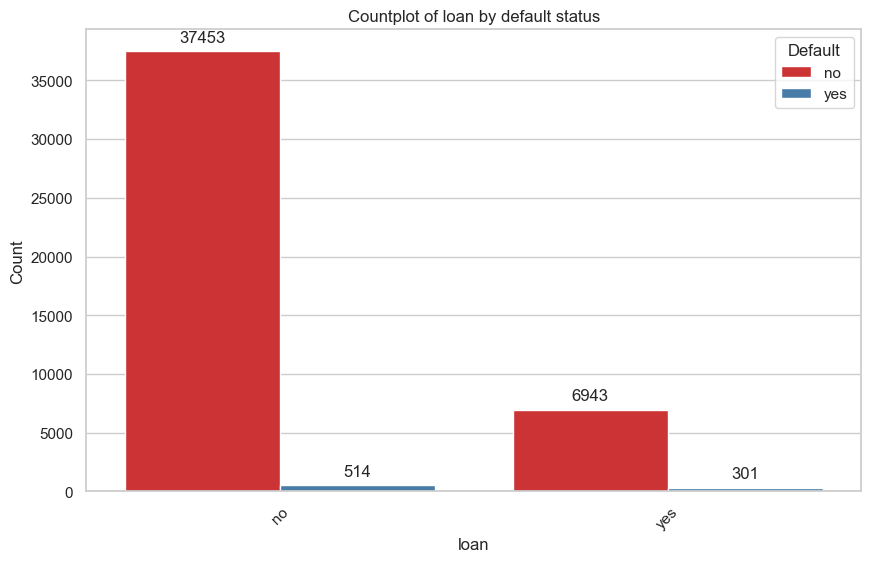

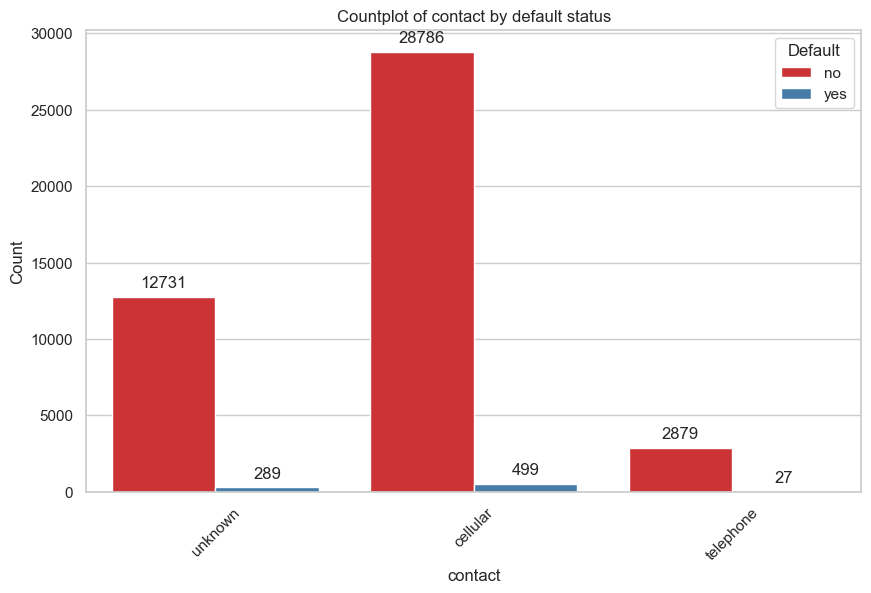

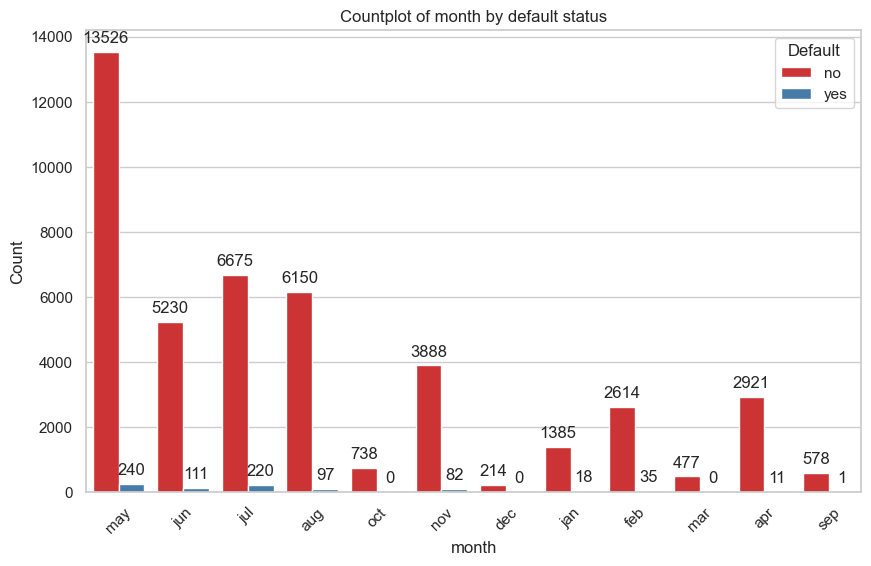

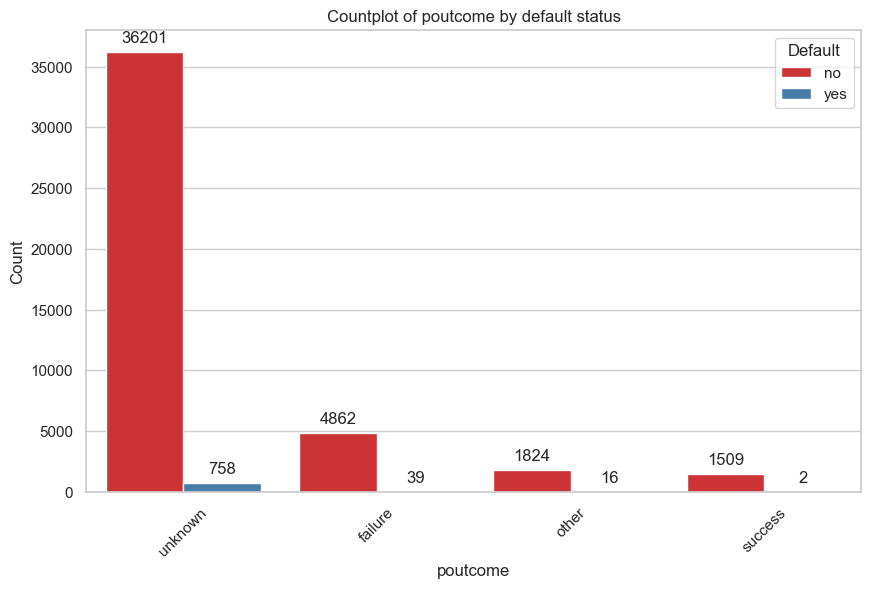

In [145]:
categories_cols = ['job','marital','education','housing', 'loan','contact','month','poutcome']
for col in categories_cols:
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x=col, hue='default', palette='Set1', hue_order=['no', 'yes'])
    plt.title(f'Countplot of {col} by default status')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(title='Default', loc='upper right')
    
    # Add frequency on top of each bar
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', 
                    xytext = (0, 10), 
                    textcoords = 'offset points')

    plt.show()

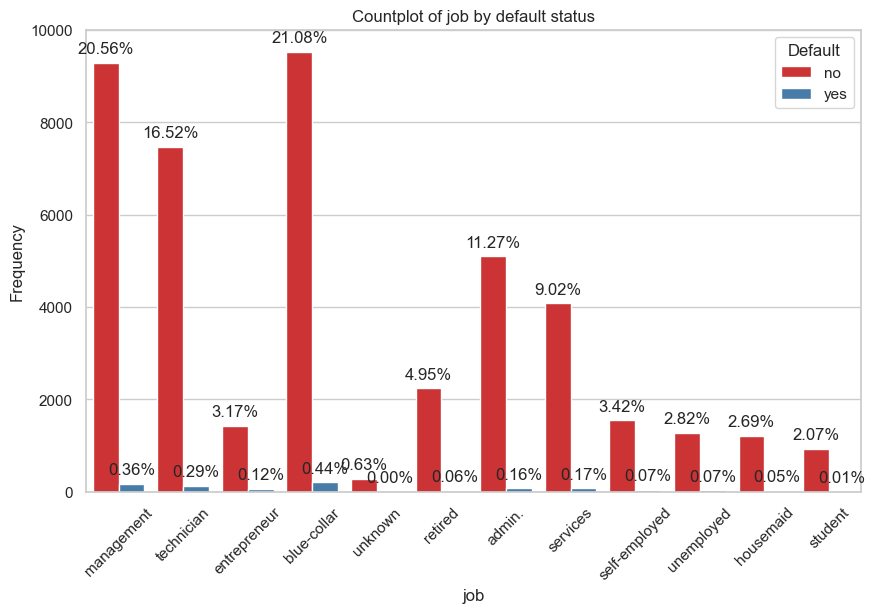

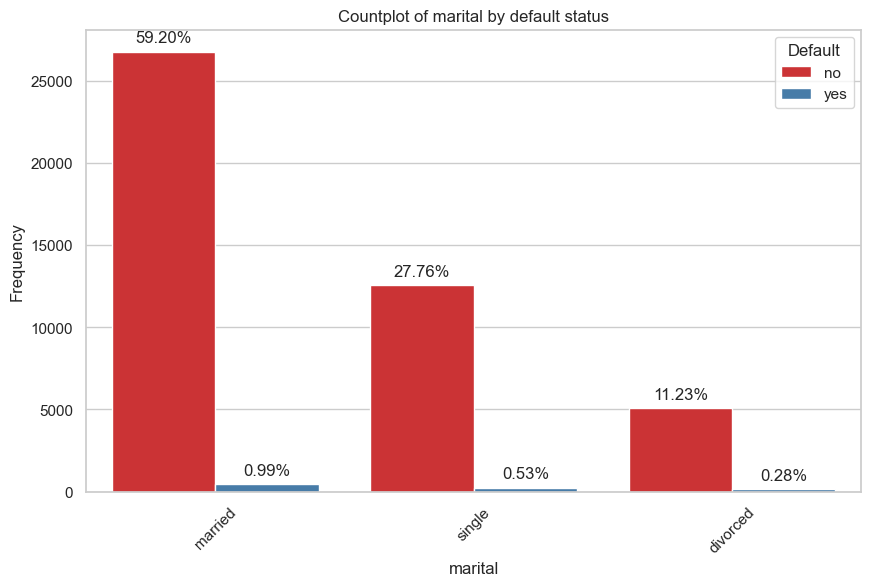

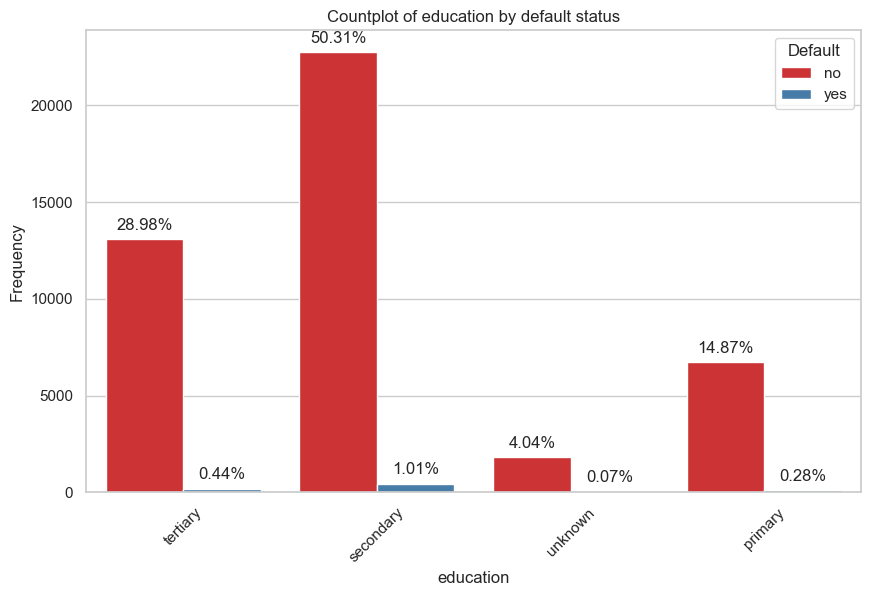

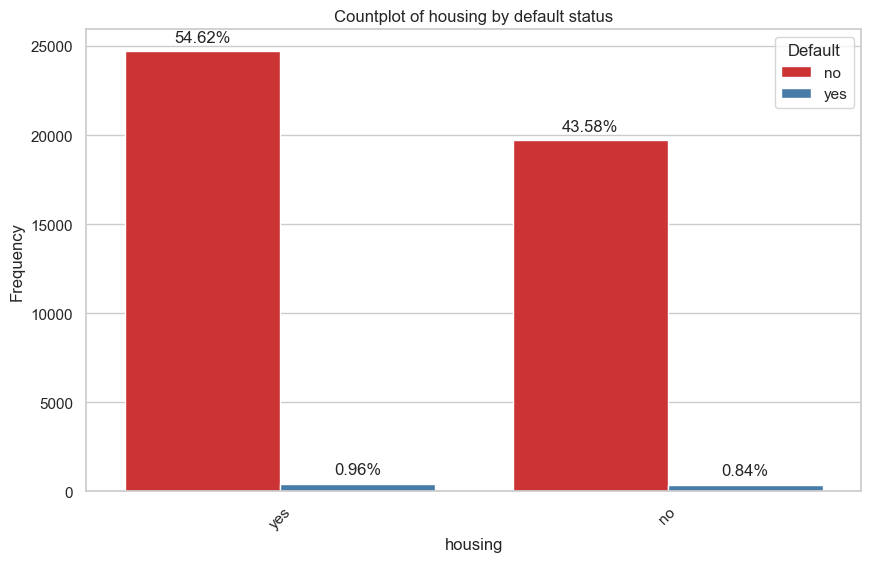

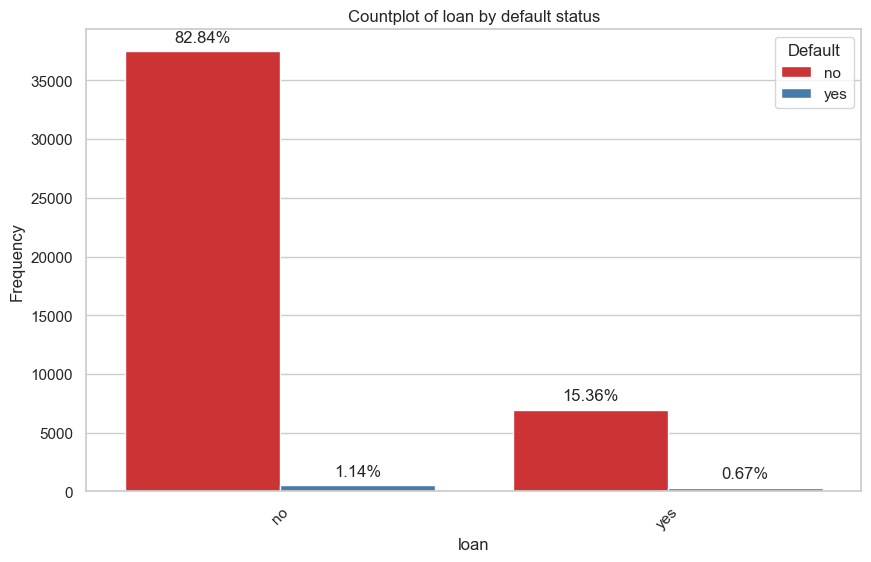

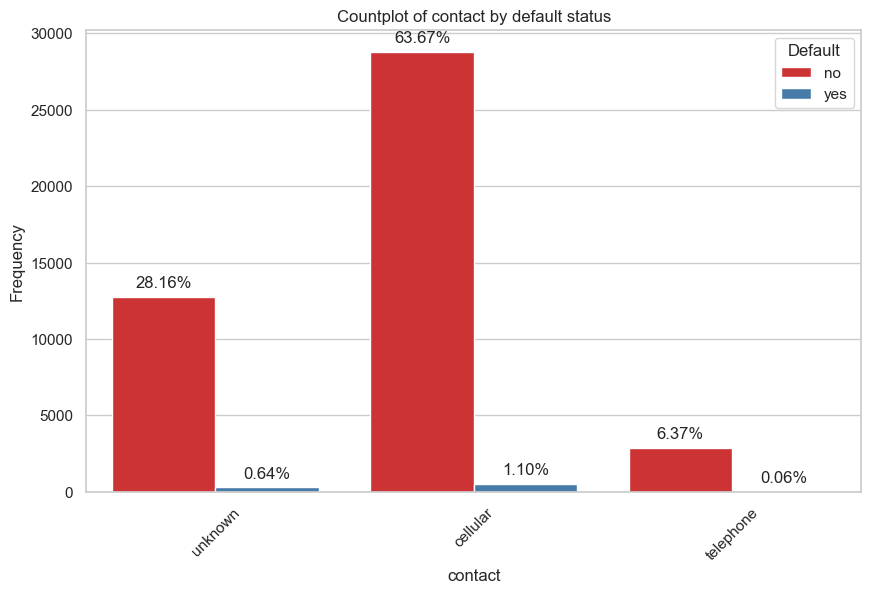

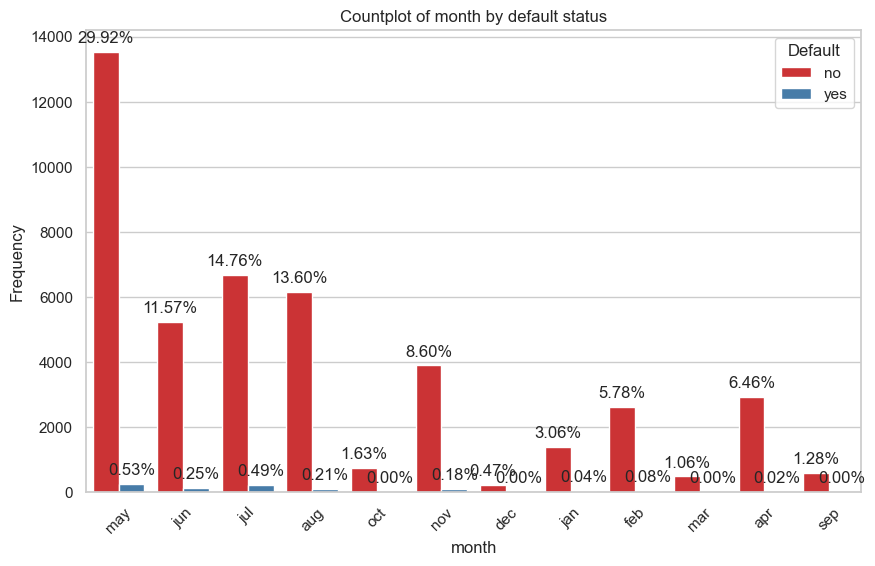

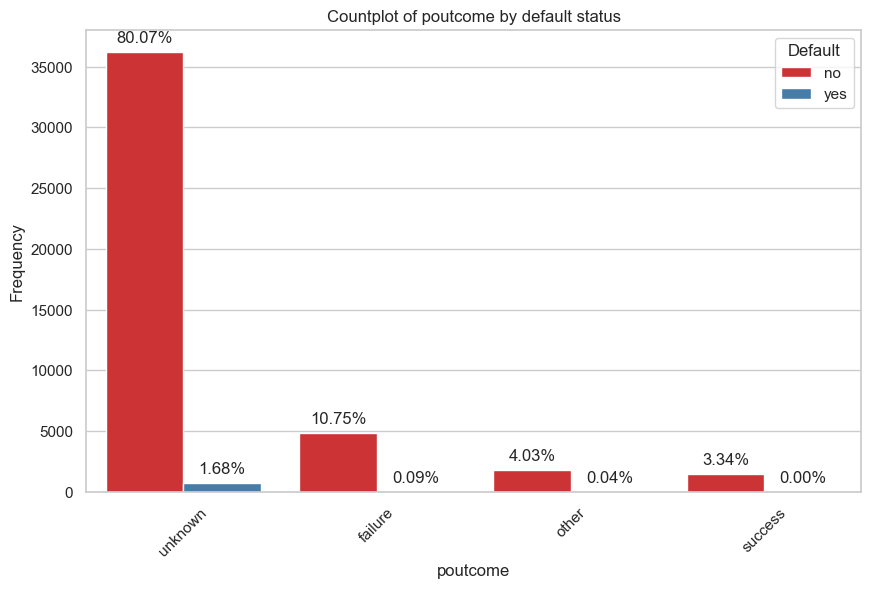

In [146]:
categories_cols = ['job','marital','education','housing', 'loan','contact','month','poutcome']
total_samples = len(df)  # Total number of samples in the dataset

for col in categories_cols:
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x=col, hue='default', palette='Set1', hue_order=['no', 'yes'])
    plt.title(f'Countplot of {col} by default status')
    plt.xlabel(col)
    plt.ylabel('Frequency')  # Update ylabel to Frequency
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend(title='Default', loc='upper right')
    
    # Calculate frequency and add it on top of each bar
    for p in ax.patches:
        frequency = p.get_height() / total_samples
        ax.annotate(f'{frequency:.2%}',  # Display frequency as percentage
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 10), 
                    textcoords='offset points')

    plt.show()


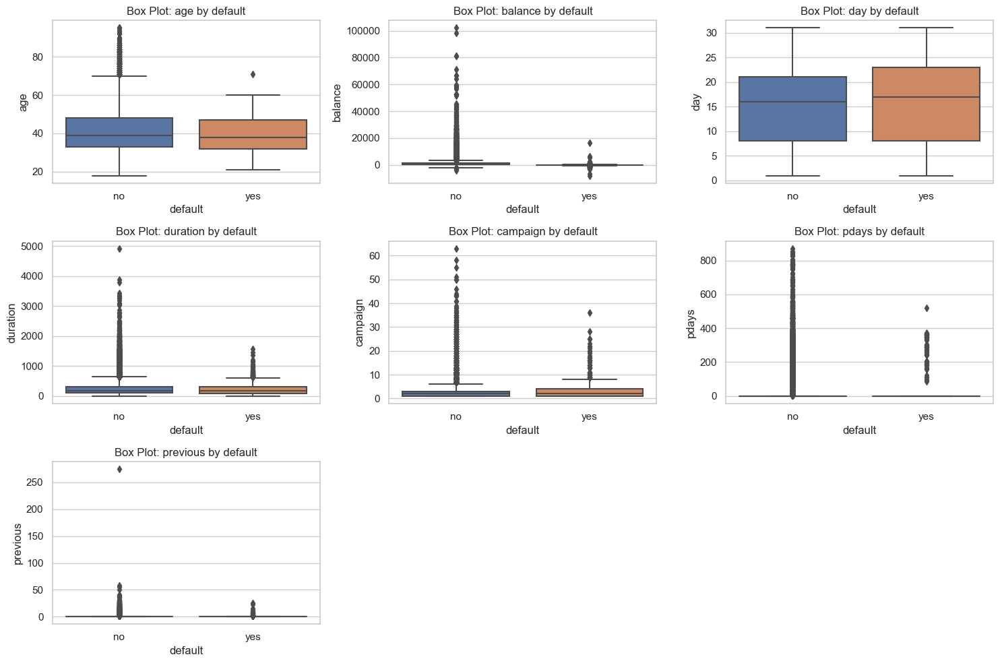

In [147]:
numericals_var = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

plt.figure(figsize=(15, 10))
for i, col in enumerate(numericals_var, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df['default'], y=df[col])
    plt.xlabel('default')
    plt.ylabel(col)
    plt.title(f'Box Plot: {col} by default')

plt.tight_layout()
plt.show()


**observations :**   people who has default=yes the number of days in avg is higher than the others 

- people who has default = yes  has  in avg higher number of campaign than the others

In [151]:
numericals_var=['age','balance','day','duration','campaign','pdays','previous']

df[numericals_var].corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


<Axes: >

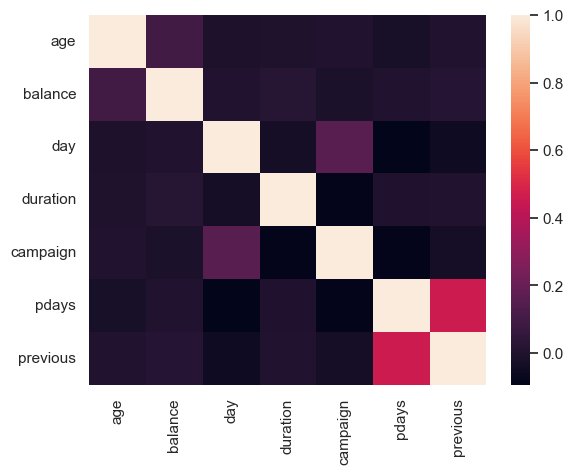

In [152]:
sns.heatmap(df[numericals_var].corr())

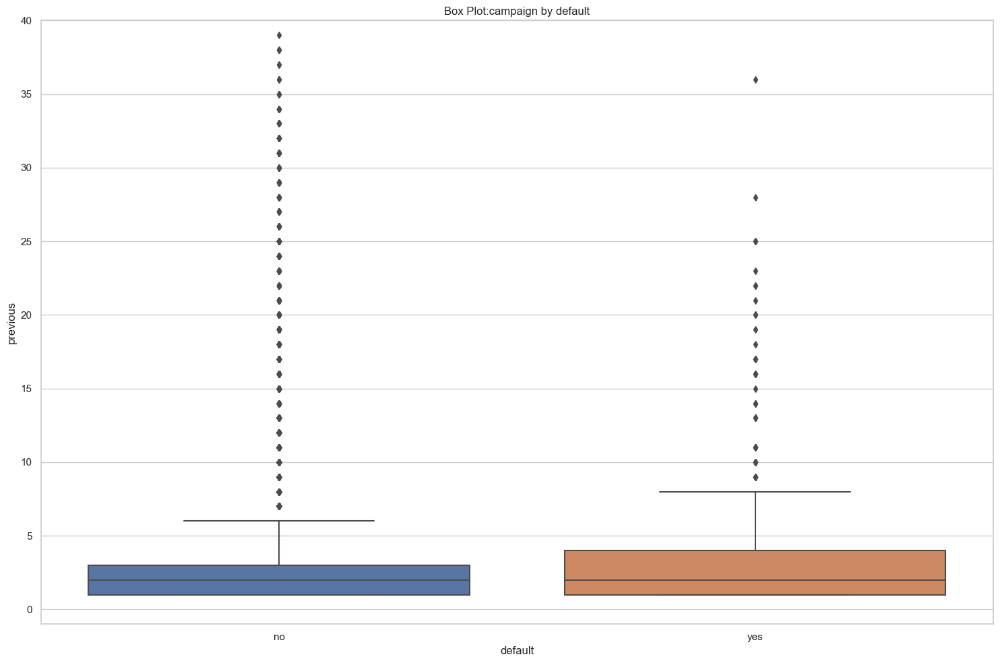

In [154]:

plt.figure(figsize=(15, 10))

sns.boxplot(x=df['default'], y=df['campaign'])
plt.xlabel('default')
plt.ylabel(col)
plt.title(f'Box Plot:campaign by default')
plt.ylim(-1,40)
plt.tight_layout()
plt.show()


D:\Anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


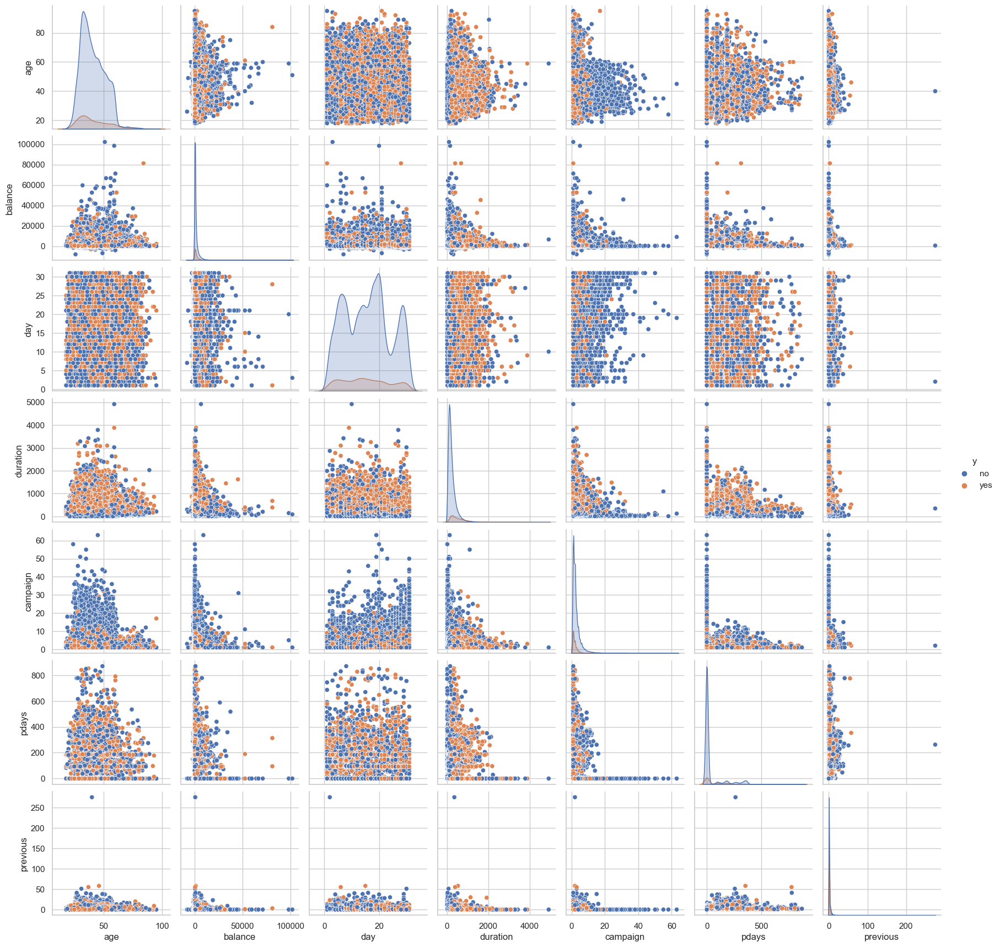

In [155]:
# visualise different relation between diff numericals col and the target
numericals_var = ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous', 'y']

sns.pairplot(df[numericals_var], hue='y', diag_kind='kde')
plt.show()

D:\Anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


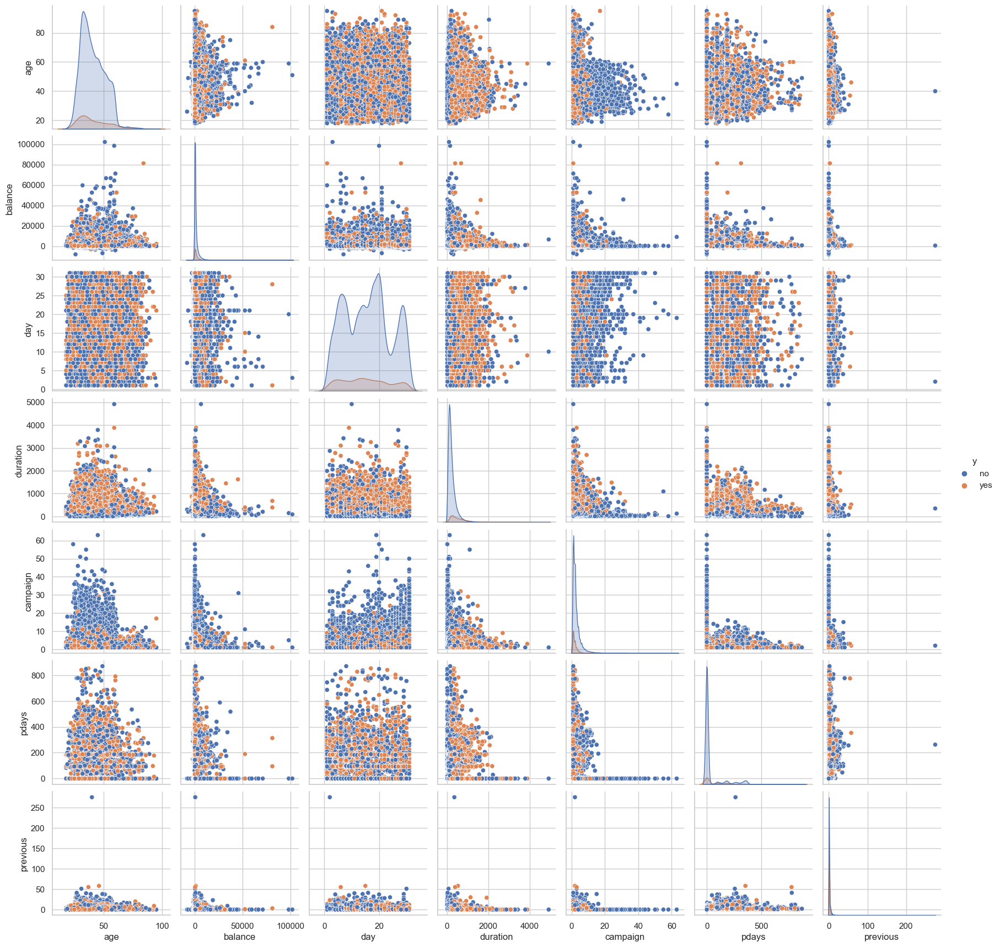

In [160]:
numericals_var=['age','balance','day','duration','campaign','pdays','previous']
sns.pairplot(df, vars=numericals_var, hue='y', diag_kind='kde')
plt.show()

D:\Anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


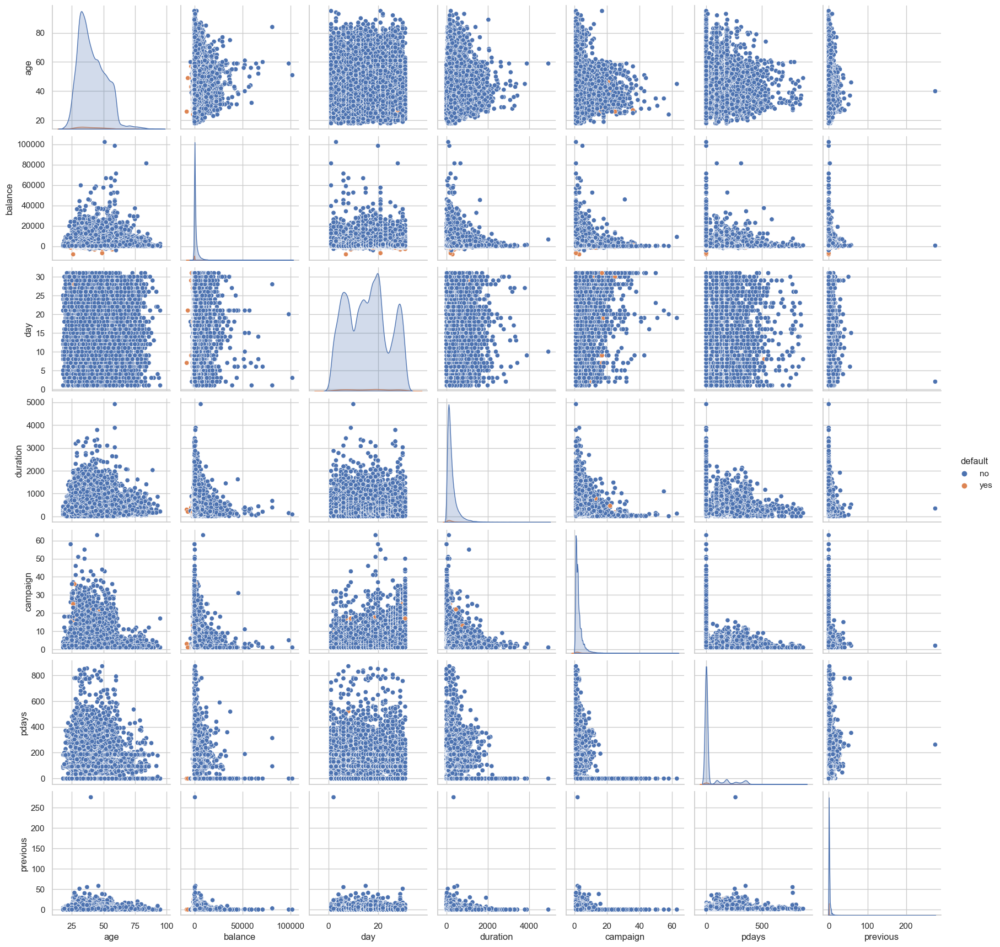

In [161]:
numericals_var=['age','balance','day','duration','campaign','pdays','previous']
sns.pairplot(df, vars=numericals_var, hue='default', diag_kind='kde')
plt.show()


D:\Anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


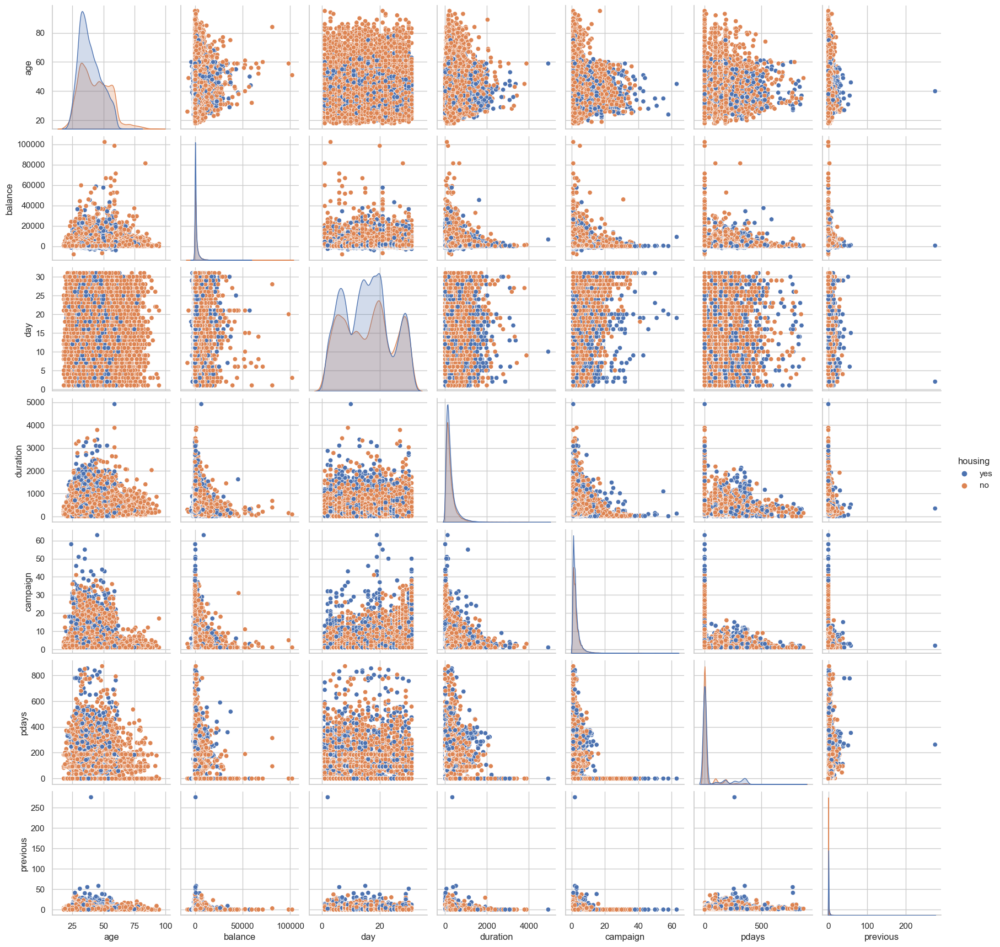

In [162]:
categories_cols = ['job','marital','education','housing', 'loan','contact','month','poutcome']


numericals_var=['age','balance','day','duration','campaign','pdays','previous']
sns.pairplot(df, vars=numericals_var, hue='housing', diag_kind='kde')
plt.show()

##  Encodage

In [163]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [164]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [165]:
categorical_cols = []
for col in df.select_dtypes('object'):
    categorical_cols.append(col)

categorical_cols    
    

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'y']

In [166]:
for col in categorical_cols  :
    print(f'{col} ------ {df[col].unique()} ')

job ------ ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student'] 
marital ------ ['married' 'single' 'divorced'] 
education ------ ['tertiary' 'secondary' 'unknown' 'primary'] 
default ------ ['no' 'yes'] 
housing ------ ['yes' 'no'] 
loan ------ ['no' 'yes'] 
contact ------ ['unknown' 'cellular' 'telephone'] 
month ------ ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep'] 
poutcome ------ ['unknown' 'failure' 'other' 'success'] 
y ------ ['no' 'yes'] 


## Test just the encoding

In [167]:
df_without_target

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown


In [170]:
categorical_cols=['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome']

for col in categorical_cols  :
    print(f'{col} ------ {df_without_target[col].unique()} ')

job ------ ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student'] 
marital ------ ['married' 'single' 'divorced'] 
education ------ ['tertiary' 'secondary' 'unknown' 'primary'] 
default ------ ['no' 'yes'] 
housing ------ ['yes' 'no'] 
loan ------ ['no' 'yes'] 
contact ------ ['unknown' 'cellular' 'telephone'] 
month ------ ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep'] 
poutcome ------ ['unknown' 'failure' 'other' 'success'] 


In [178]:
df_clean1=df_without_target
df_clean1

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown


In [182]:
df_clean2 = df_without_target

In [183]:
df_clean2

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown


### OneHotEncoding Using get_dummies

In [185]:

not_ordered_cols = ['job', 'marital', 'housing', 'loan', 'poutcome', 'contact', 'default']

# Apply one-hot encoding using pd.get_dummies to specified columns
df_encoded_columns = pd.get_dummies(df_clean1[not_ordered_cols])

# Cast the encoded columns to integers
df_encoded_columns = df_encoded_columns.astype(int)

# Drop the original categorical columns
df_clean1.drop(columns=not_ordered_cols, inplace=True)

# Concatenate the encoded columns with the original dataframe
df_encoded_2 = pd.concat([df_clean1, df_encoded_columns], axis=1)

# Display the result
print(df_encoded_2.head())

   age  education  balance  day month  duration  campaign  pdays  previous  \
0   58   tertiary     2143    5   may       261         1     -1         0   
1   44  secondary       29    5   may       151         1     -1         0   
2   33  secondary        2    5   may        76         1     -1         0   
3   47    unknown     1506    5   may        92         1     -1         0   
4   33    unknown        1    5   may       198         1     -1         0   

   job_admin.  ...  loan_yes  poutcome_failure  poutcome_other  \
0           0  ...         0                 0               0   
1           0  ...         0                 0               0   
2           0  ...         1                 0               0   
3           0  ...         0                 0               0   
4           0  ...         0                 0               0   

   poutcome_success  poutcome_unknown  contact_cellular  contact_telephone  \
0                 0                 1                 0 

In [186]:
df_encoded_2.head()

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,...,loan_yes,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes
0,58,tertiary,2143,5,may,261,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
1,44,secondary,29,5,may,151,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
2,33,secondary,2,5,may,76,1,-1,0,0,...,1,0,0,0,1,0,0,1,1,0
3,47,unknown,1506,5,may,92,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
4,33,unknown,1,5,may,198,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0


In [187]:
df_encoded=df_encoded_2

In [188]:
df_encoded.head()

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,...,loan_yes,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes
0,58,tertiary,2143,5,may,261,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
1,44,secondary,29,5,may,151,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
2,33,secondary,2,5,may,76,1,-1,0,0,...,1,0,0,0,1,0,0,1,1,0
3,47,unknown,1506,5,may,92,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
4,33,unknown,1,5,may,198,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0


In [189]:
df_encoded['education'].unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [192]:
from sklearn.preprocessing import LabelEncoder

# Replace 'unknown' with a value that doesn't conflict with ordinal encoding
df_clean1['education'] = df_clean1['education'].replace('unknown', 'other')

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'education' column
df_clean1['education'] = label_encoder.fit_transform(df_clean1['education'])

# Display the encoded unique values for the 'education' column
print(df_clean1['education'].unique())
print(df_clean1.head())


[3 2 0 1]
   age  education  balance  day month  duration  campaign  pdays  previous
0   58          3     2143    5   may       261         1     -1         0
1   44          2       29    5   may       151         1     -1         0
2   33          2        2    5   may        76         1     -1         0
3   47          0     1506    5   may        92         1     -1         0
4   33          0        1    5   may       198         1     -1         0


In [193]:
# now i will encode the 'education' col
from sklearn.preprocessing import LabelEncoder

# Replace 'unknown' with a value that doesn't conflict with ordinal encoding
df_encoded['education'] = df_encoded['education'].replace('unknown', 'other')

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'education' column
df_encoded['education'] = label_encoder.fit_transform(df_encoded['education'])

# Display the encoded unique values for the 'education' column
print(df_encoded['education'].unique())
print(df_encoded.head())


[3 2 0 1]
   age  education  balance  day month  duration  campaign  pdays  previous  \
0   58          3     2143    5   may       261         1     -1         0   
1   44          2       29    5   may       151         1     -1         0   
2   33          2        2    5   may        76         1     -1         0   
3   47          0     1506    5   may        92         1     -1         0   
4   33          0        1    5   may       198         1     -1         0   

   job_admin.  ...  loan_yes  poutcome_failure  poutcome_other  \
0           0  ...         0                 0               0   
1           0  ...         0                 0               0   
2           0  ...         1                 0               0   
3           0  ...         0                 0               0   
4           0  ...         0                 0               0   

   poutcome_success  poutcome_unknown  contact_cellular  contact_telephone  \
0                 0                 1         

In [196]:

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'month' column
df_encoded['month'] = label_encoder.fit_transform(df_encoded['month'])

# Display the encoded unique values for the 'month' column
print(df_encoded['month'].unique())

[ 8  6  5  1 10  9  2  4  3  7  0 11]


In [197]:
df_encoded

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,...,loan_yes,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes
0,58,3,2143,5,8,261,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
1,44,2,29,5,8,151,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
2,33,2,2,5,8,76,1,-1,0,0,...,1,0,0,0,1,0,0,1,1,0
3,47,0,1506,5,8,92,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
4,33,0,1,5,8,198,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,3,825,17,9,977,3,-1,0,0,...,0,0,0,0,1,1,0,0,1,0
45207,71,1,1729,17,9,456,2,-1,0,0,...,0,0,0,0,1,1,0,0,1,0
45208,72,2,5715,17,9,1127,5,184,3,0,...,0,0,0,1,0,1,0,0,1,0
45209,57,2,668,17,9,508,4,-1,0,0,...,0,0,0,0,1,0,1,0,1,0


In [201]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

X = df_encoded
y = raw_data['y']

# Split the data into training and testing sets (e.g., 80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Initialize logistic regression model
model = LogisticRegression(max_iter=1000)

# Train the model on the training data
model.fit(X_train, y_train)

# Predict the target variable on the testing data
y_pred = model.predict(X_test)



D:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [202]:
from sklearn.metrics import confusion_matrix, classification_report

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[7767  213]
 [ 732  331]]

Classification Report:
              precision    recall  f1-score   support

          no       0.91      0.97      0.94      7980
         yes       0.61      0.31      0.41      1063

    accuracy                           0.90      9043
   macro avg       0.76      0.64      0.68      9043
weighted avg       0.88      0.90      0.88      9043



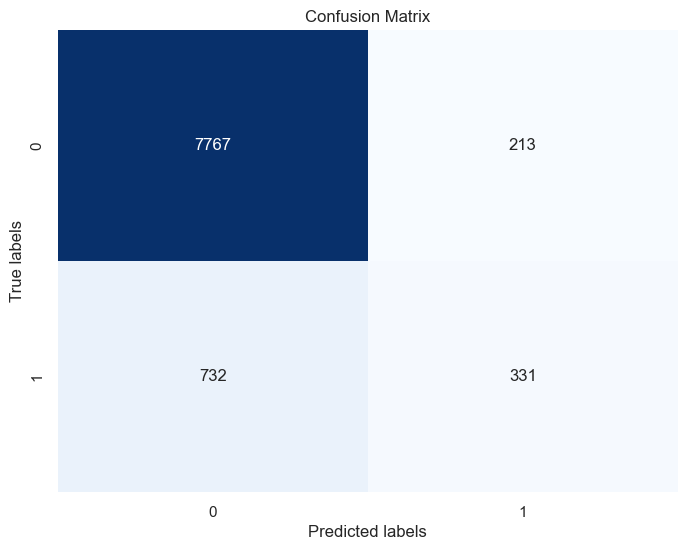

In [203]:

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

## Evaluation

In [204]:

# let's remove the outliers and test again

During EDA, we observed the presence of outliers. These outliers can affect the quality of a Machine Learning model. Therefore, we need to address them. Before addressing the outliers, we first need to detect them.

There are several methods for detecting outliers. According to the Interquartile Range (IQR) method, a value is considered an outlier if it satisfies one of the following conditions:
- If the value is less than $Q_1 - 1.5 \times IQR$
- If the value is greater than $Q_3 + 1.5 \times IQR$

Here, $IQR$ is the Interquartile Range, calculated as $IQR = Q_3 - Q_1$, where $Q_1$ is the first quartile and $Q_3$ is the third quartile.

In [205]:
raw_data.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


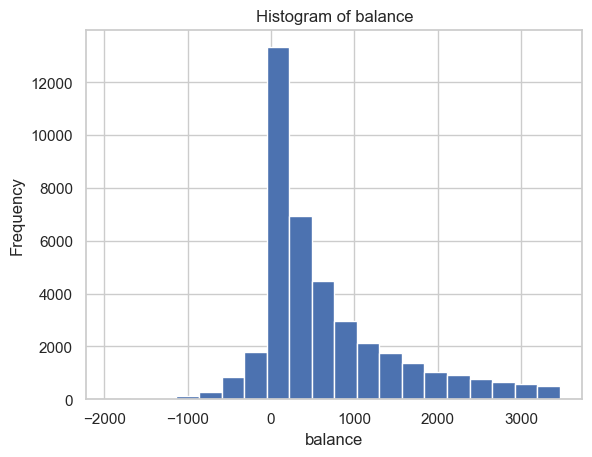

In [206]:
#we will start with the  'balance' and see what will happened
# Identification of outliers for 'person_income'
df_clean_outliers_balance =raw_data
Q1 = df_clean_outliers_balance['balance'].quantile(0.25)
Q3 = df_clean_outliers_balance['balance'].quantile(0.75)
IQR = Q3 - Q1
index_outlier_income = df_clean_outliers_balance[(df_clean_outliers_balance['balance'] < Q1 - 1.5 * IQR) | (df_clean_outliers_balance['balance'] > Q3 + 1.5 * IQR)].index

# Removal of outliers for 'person_income'
df_clean_outliers_balance['balance'] = df_clean_outliers_balance['balance'].drop(index_outlier_income)

# Verification: Histogram of annual income
plt.hist(df_clean_outliers_balance['balance'], bins=20)
plt.title("Histogram of balance")
plt.xlabel("balance")
plt.ylabel("Frequency")
plt.show()

In [207]:
df_clean_outliers_balance

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143.0,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29.0,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2.0,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506.0,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1.0,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825.0,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729.0,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,NaN,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668.0,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [210]:
df_clean_outliers_balance.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,40482.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,640.636233,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,844.435442,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-1944.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,46.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,349.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,980.750000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,3462.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [214]:
df_clean_outliers_balance_without_target=df_clean_outliers_balance.drop(columns='y',axis=1)
df_clean_outliers_balance_without_target
target = df_clean_outliers_balance['y']
target

0         no
1         no
2         no
3         no
4         no
        ... 
45206    yes
45207    yes
45208    yes
45209     no
45210     no
Name: y, Length: 45211, dtype: object

In [215]:
def one_hot_encode_columns(df, not_ordered_cols):
   
    # Apply one-hot encoding using pd.get_dummies to specified columns
    df_encoded_columns = pd.get_dummies(df[not_ordered_cols])

    # Cast the encoded columns to integers
    df_encoded_columns = df_encoded_columns.astype(int)

    # Drop the original categorical columns
    df.drop(columns=not_ordered_cols, inplace=True)

    # Concatenate the encoded columns with the original dataframe
    df_encoded = pd.concat([df, df_encoded_columns], axis=1)

    return df_encoded

In [216]:
not_ordered_cols = ['job', 'marital', 'housing', 'loan', 'poutcome', 'contact', 'default']
df_clean_outliers_balance_without_target_encoded=one_hot_encode_columns(df_clean_outliers_balance_without_target,not_ordered_cols)

In [217]:
df_clean_outliers_balance_without_target_encoded

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,...,loan_yes,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes
0,58,tertiary,2143.0,5,may,261,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
1,44,secondary,29.0,5,may,151,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
2,33,secondary,2.0,5,may,76,1,-1,0,0,...,1,0,0,0,1,0,0,1,1,0
3,47,unknown,1506.0,5,may,92,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
4,33,unknown,1.0,5,may,198,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,tertiary,825.0,17,nov,977,3,-1,0,0,...,0,0,0,0,1,1,0,0,1,0
45207,71,primary,1729.0,17,nov,456,2,-1,0,0,...,0,0,0,0,1,1,0,0,1,0
45208,72,secondary,NaN,17,nov,1127,5,184,3,0,...,0,0,0,1,0,1,0,0,1,0
45209,57,secondary,668.0,17,nov,508,4,-1,0,0,...,0,0,0,0,1,0,1,0,1,0


In [218]:
from sklearn.preprocessing import LabelEncoder

def encode_education_column(df):
    """
    Encodes the 'education' column using label encoding, replacing 'unknown' with 'other'.

    Parameters:
    - df: DataFrame
        The input DataFrame.

    Returns:
    - df_encoded: DataFrame
        The DataFrame with the 'education' column encoded.
    """
    # Replace 'unknown' with 'other'
    df['education'] = df['education'].replace('unknown', 'other')
    
    # Initialize LabelEncoder
    label_encoder = LabelEncoder()

    # Apply label encoding to the 'education' column
    df['education'] = label_encoder.fit_transform(df['education'])

    return df


In [220]:
from sklearn.preprocessing import LabelEncoder

def encode_month_column(df):
    """
    Encodes the 'month' column using label encoding.

    Parameters:
    - df: DataFrame
        The input DataFrame.

    Returns:
    - df_encoded: DataFrame
        The DataFrame with the 'month' column encoded.
    """
    # Initialize LabelEncoder
    label_encoder = LabelEncoder()

    # Apply label encoding to the 'month' column
    df['month'] = label_encoder.fit_transform(df['month'])

    return df



In [221]:
#encode the education column
df_clean_outliers_balance_without_target_encoded_1=encode_education_column(df_clean_outliers_balance_without_target_encoded)

In [222]:
df_clean_outliers_balance_without_target_encoded=encode_month_column(df_clean_outliers_balance_without_target_encoded_1)

In [223]:
df_clean_outliers_balance_without_target_encoded

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,...,loan_yes,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes
0,58,3,2143.0,5,8,261,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
1,44,2,29.0,5,8,151,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
2,33,2,2.0,5,8,76,1,-1,0,0,...,1,0,0,0,1,0,0,1,1,0
3,47,0,1506.0,5,8,92,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
4,33,0,1.0,5,8,198,1,-1,0,0,...,0,0,0,0,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,3,825.0,17,9,977,3,-1,0,0,...,0,0,0,0,1,1,0,0,1,0
45207,71,1,1729.0,17,9,456,2,-1,0,0,...,0,0,0,0,1,1,0,0,1,0
45208,72,2,NaN,17,9,1127,5,184,3,0,...,0,0,0,1,0,1,0,0,1,0
45209,57,2,668.0,17,9,508,4,-1,0,0,...,0,0,0,0,1,0,1,0,1,0


In [224]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

def train_logistic_regression(X, y):
    """
    Trains a logistic regression model on the input features and target variable.

    Parameters:
    - X: DataFrame
        The input features.
    - y: Series
        The target variable.

    Returns:
    - y_pred: array-like
        The predicted target variable.
    """
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # Initialize logistic regression model
    model = LogisticRegression(max_iter=1000)

    # Train the model on the training data
    model.fit(X_train, y_train)

    # Predict the target variable on the testing data
    y_pred = model.predict(X_test)

    return y_pred,y_test


In [228]:
# Calculate the median of the 'balance' column
balance_median = df_clean_outliers_balance_without_target_encoded['balance'].median()

# Fill missing values in the 'balance' column with the median
df_clean_outliers_balance_without_target_encoded['balance'].fillna(balance_median, inplace=True)

# Check if there are any remaining missing values
print(df_clean_outliers_balance_without_target_encoded.isna().sum())

age                  0
education            0
balance              0
day                  0
month                0
duration             0
campaign             0
pdays                0
previous             0
job_admin.           0
job_blue-collar      0
job_entrepreneur     0
job_housemaid        0
job_management       0
job_retired          0
job_self-employed    0
job_services         0
job_student          0
job_technician       0
job_unemployed       0
job_unknown          0
marital_divorced     0
marital_married      0
marital_single       0
housing_no           0
housing_yes          0
loan_no              0
loan_yes             0
poutcome_failure     0
poutcome_other       0
poutcome_success     0
poutcome_unknown     0
contact_cellular     0
contact_telephone    0
contact_unknown      0
default_no           0
default_yes          0
dtype: int64


In [230]:
df_clean_outliers_balance_without_target_encoded.isna().sum()

age                  0
education            0
balance              0
day                  0
month                0
duration             0
campaign             0
pdays                0
previous             0
job_admin.           0
job_blue-collar      0
job_entrepreneur     0
job_housemaid        0
job_management       0
job_retired          0
job_self-employed    0
job_services         0
job_student          0
job_technician       0
job_unemployed       0
job_unknown          0
marital_divorced     0
marital_married      0
marital_single       0
housing_no           0
housing_yes          0
loan_no              0
loan_yes             0
poutcome_failure     0
poutcome_other       0
poutcome_success     0
poutcome_unknown     0
contact_cellular     0
contact_telephone    0
contact_unknown      0
default_no           0
default_yes          0
dtype: int64

In [229]:
target = df_clean_outliers_balance['y']
y_pred,y_test=train_logistic_regression(df_clean_outliers_balance_without_target_encoded, target)

D:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [231]:
from sklearn.metrics import confusion_matrix, classification_report

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[7760  220]
 [ 715  348]]

Classification Report:
              precision    recall  f1-score   support

          no       0.92      0.97      0.94      7980
         yes       0.61      0.33      0.43      1063

    accuracy                           0.90      9043
   macro avg       0.76      0.65      0.68      9043
weighted avg       0.88      0.90      0.88      9043



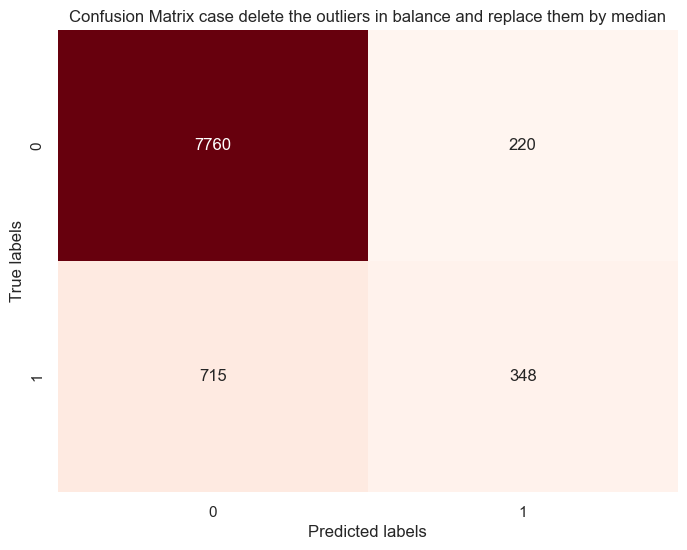

In [233]:


# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix case delete the outliers in balance and replace them by median')
plt.show()

i don't made a big difference, may be i should use normalisation

## Scaling 

In [248]:
#Let's do some scaling 
new_df= raw_data
new_df_without_target=new_df.drop(columns='y',axis=1)

target =new_df['y']
target


0         no
1         no
2         no
3         no
4         no
        ... 
45206    yes
45207    yes
45208    yes
45209     no
45210     no
Name: y, Length: 45211, dtype: object

In [249]:
 raw_data

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [250]:
new_df_without_target.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
dtype: int64

In [251]:
from sklearn.preprocessing import RobustScaler

def scale_numerical_with_robust_scaler(df):
    """
    Scales the numerical columns of the input DataFrame using RobustScaler.

    Parameters:
    - df: DataFrame
        The input DataFrame with both numerical and categorical columns.

    Returns:
    - df_scaled: DataFrame
        The DataFrame with numerical columns scaled.
    """
    # Select numerical columns
    numerical_cols=['age','balance','day','duration','campaign','pdays','previous']    
    # Initialize RobustScaler
    scaler = RobustScaler()

    # Fit the scaler to the numerical data and transform it
    df_scaled = df.copy()
    df_scaled[numerical_cols] = scaler.fit_transform(df[numerical_cols])

    return df_scaled


In [252]:
df_scaled = scale_numerical_with_robust_scaler(new_df_without_target)

In [253]:
df_scaled

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,1.266667,management,married,tertiary,no,1.250000,yes,no,unknown,-0.846154,may,0.375000,-0.5,0.0,0.0,unknown
1,0.333333,technician,single,secondary,no,-0.308997,yes,no,unknown,-0.846154,may,-0.134259,-0.5,0.0,0.0,unknown
2,-0.400000,entrepreneur,married,secondary,no,-0.328909,yes,yes,unknown,-0.846154,may,-0.481481,-0.5,0.0,0.0,unknown
3,0.533333,blue-collar,married,unknown,no,0.780236,yes,no,unknown,-0.846154,may,-0.407407,-0.5,0.0,0.0,unknown
4,-0.400000,unknown,single,unknown,no,-0.329646,no,no,unknown,-0.846154,may,0.083333,-0.5,0.0,0.0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.800000,technician,married,tertiary,no,0.278024,no,no,cellular,0.076923,nov,3.689815,0.5,0.0,0.0,unknown
45207,2.133333,retired,divorced,primary,no,0.944690,no,no,cellular,0.076923,nov,1.277778,0.0,0.0,0.0,unknown
45208,2.200000,retired,married,secondary,no,3.884218,no,no,cellular,0.076923,nov,4.384259,1.5,185.0,3.0,success
45209,1.200000,blue-collar,married,secondary,no,0.162242,no,no,telephone,0.076923,nov,1.518519,1.0,0.0,0.0,unknown


In [254]:
df_scaled.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
dtype: int64

In [257]:
not_ordered_cols = ['job', 'marital', 'housing', 'loan', 'poutcome', 'contact', 'default']
df_clean_after_scaling_encoded=one_hot_encode_columns(df_scaled,not_ordered_cols)

In [258]:
df_clean_after_scaling_encoded

,age,education,balance,day,month,duration,campaign,pdays,previous,job_admin.,...,loan_yes,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown,default_no,default_yes
0,1.266667,tertiary,1.250000,-0.846154,may,0.375000,-0.5,0.0,0.0,0,...,0,0,0,0,1,0,0,1,1,0
1,0.333333,secondary,-0.308997,-0.846154,may,-0.134259,-0.5,0.0,0.0,0,...,0,0,0,0,1,0,0,1,1,0
2,-0.400000,secondary,-0.328909,-0.846154,may,-0.481481,-0.5,0.0,0.0,0,...,1,0,0,0,1,0,0,1,1,0
3,0.533333,unknown,0.780236,-0.846154,may,-0.407407,-0.5,0.0,0.0,0,...,0,0,0,0,1,0,0,1,1,0
4,-0.400000,unknown,-0.329646,-0.846154,may,0.083333,-0.5,0.0,0.0,0,...,0,0,0,0,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.800000,tertiary,0.278024,0.076923,nov,3.689815,0.5,0.0,0.0,0,...,0,0,0,0,1,1,0,0,1,0
45207,2.133333,primary,0.944690,0.076923,nov,1.277778,0.0,0.0,0.0,0,...,0,0,0,0,1,1,0,0,1,0
45208,2.200000,secondary,3.884218,0.076923,nov,4.384259,1.5,185.0,3.0,0,...,0,0,0,1,0,1,0,0,1,0
45209,1.200000,secondary,0.162242,0.076923,nov,1.518519,1.0,0.0,0.0,0,...,0,0,0,0,1,0,1,0,1,0


In [259]:
df_clean_after_scaling_encoded_1=encode_education_column(df_clean_after_scaling_encoded)
df_clean_after_scaling_encoded=encode_month_column(df_clean_after_scaling_encoded_1)

In [260]:
target =new_df['y']
y_pred,y_test=train_logistic_regression(df_clean_after_scaling_encoded, target)

Confusion Matrix:
[[7764  216]
 [ 709  354]]

Classification Report:
              precision    recall  f1-score   support

          no       0.92      0.97      0.94      7980
         yes       0.62      0.33      0.43      1063

    accuracy                           0.90      9043
   macro avg       0.77      0.65      0.69      9043
weighted avg       0.88      0.90      0.88      9043



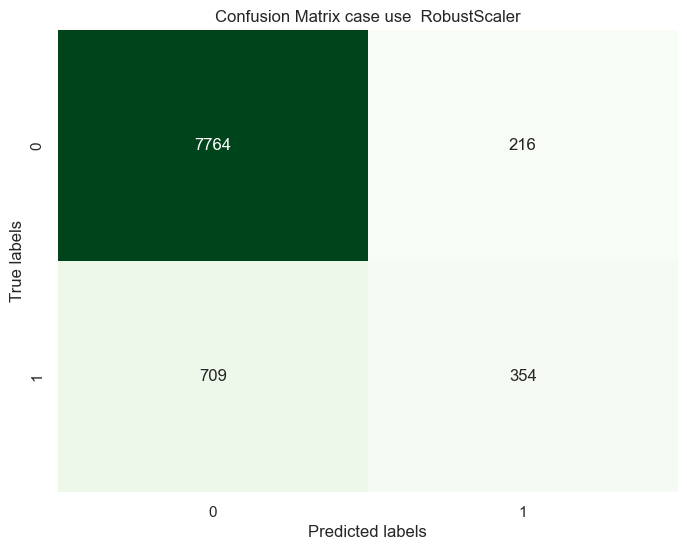

In [263]:
from sklearn.metrics import confusion_matrix, classification_report

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix case use  RobustScaler')
plt.show()